In [194]:
import jax
from jax.config import config
config.update("jax_enable_x64", True)
from jax.tree_util import tree_map
import os

import dLux as dl
from matplotlib import colors, cm, pyplot as plt
from matplotlib import colormaps
import jax.numpy as np
from jax.scipy.special import bessel_jn
from jax import custom_jvp, pure_callback, vmap, grad, jit
import jax.random as jr

import zodiax as zdx
import optax

from scipy.special import jv

import webbpsf
import poppy
import pysiaf
import scipy
from astropy.io import fits
import astropy.units as u
from tqdm.notebook import tqdm #should install ipywidgets package to make it work
from dLux.optics import OpticalLayer
from dLux.detectors import DetectorLayer

from nircam_functions import *

Array = np.ndarray

In [2]:
plt.figure()
plt.rcParams['image.cmap'] = 'inferno'
plt.rcParams["text.usetex"] = 'true'
plt.rcParams["font.family"] = "serif"
plt.rcParams['figure.dpi'] = 120

<Figure size 640x480 with 0 Axes>

In [3]:
def get_osys_imager(instrument, filtr, detector, aperture):
    webb_osys = getattr(webbpsf, instrument)()
    webb_osys.filter = filtr
    webb_osys.detector = detector

    # Siaf aperture
    aper = pysiaf.Siaf(instrument)[aperture]
    webb_osys.set_position_from_aperture_name(aperture)
    
    return webb_osys

In [4]:
def get_nircam():
    webb_osys = get_osys_imager("NIRCam", "F300M", "NRCA5", "NRCA5_FULL_MASK430R") #same as nc.
    webb_osys.options['jitter'] = None   # jitter model name or None
    webb_osys.options['jitter_sigma'] = 0.000  # in arcsec per axis, default 0.007
    webb_osys.options['add_distortion'] = False
    return webb_osys

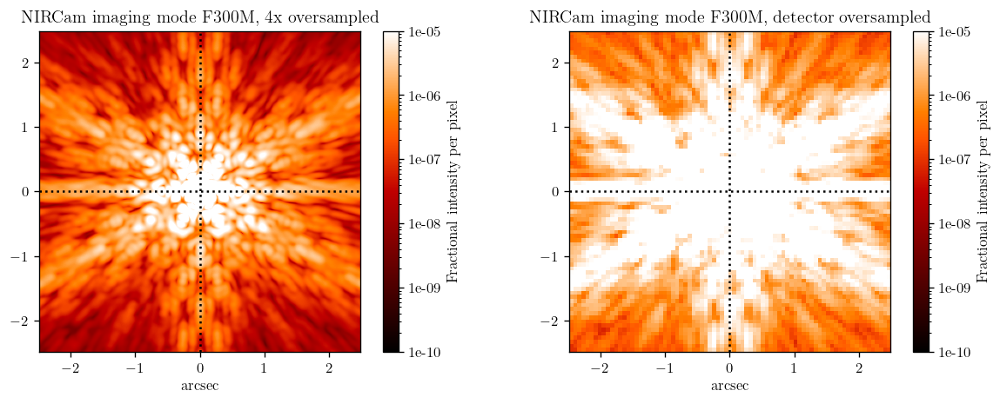

In [5]:
webb_osys = get_nircam()

webb_osys.filter='F300M'
webb_osys.calc_psf('imager.fits', oversample=4, fov_arcsec=5) #, monochromatic=3.16e-6)   # create highly oversampled output image

plt.figure(figsize=(12,4))
plt.subplot(1,2,1)
webbpsf.display_psf('imager.fits', vmin=1e-10, vmax=1e-5,
    ext='OVERSAMP', title='NIRCam imaging mode F300M, 4x oversampled', crosshairs=True)
plt.subplot(1,2,2)
webbpsf.display_psf('imager.fits', vmin=1e-10, vmax=1e-5,
    ext='DET_SAMP', title='NIRCam imaging mode F300M, detector oversampled', crosshairs=True)

#plt.savefig('example_nircam_coron_resampling.png')

In [6]:
from astropy.io import fits

hdul = fits.open('imager.fits')

webbpsf_fits = hdul


webbpsf_header = hdul[0].header
webbpsf_data_star = hdul[0].data


In [7]:
webbpsf_data =  webbpsf_data_star

In [8]:
hdul.info()

Filename: imager.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  OVERSAMP      1 PrimaryHDU     114   (316, 316)   float64   
  1  DET_SAMP      1 ImageHDU       115   (79, 79)   float64   
  2  OVERDIST      1 ImageHDU       159   (316, 316)   float64   
  3  DET_DIST      1 ImageHDU       160   (79, 79)   float64   


In [9]:
# hdul[0].header

[<webbpsf.opds.OTE_Linear_Model_WSS object at 0x16dcc22c0>, <poppy.poppy_core.CoordinateInversion object at 0x16dcc2740>, <webbpsf.optics.NIRCamFieldAndWavelengthDependentAberration object at 0x16dcc3d00>, <poppy.poppy_core.Detector object at 0x16dcc3cd0>]
Plane 0: Pupil plane: JWST Entrance Pupil 



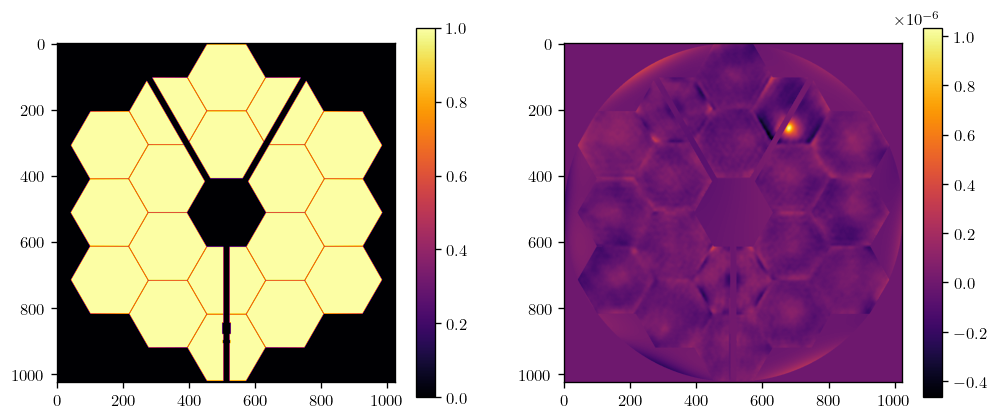

Plane 1: Coordinate Inversion in y axis

Plane 2: Pupil plane: NIRCamLWA internal WFE at V2V3=(1.46,-6.75)', near ISIM30 



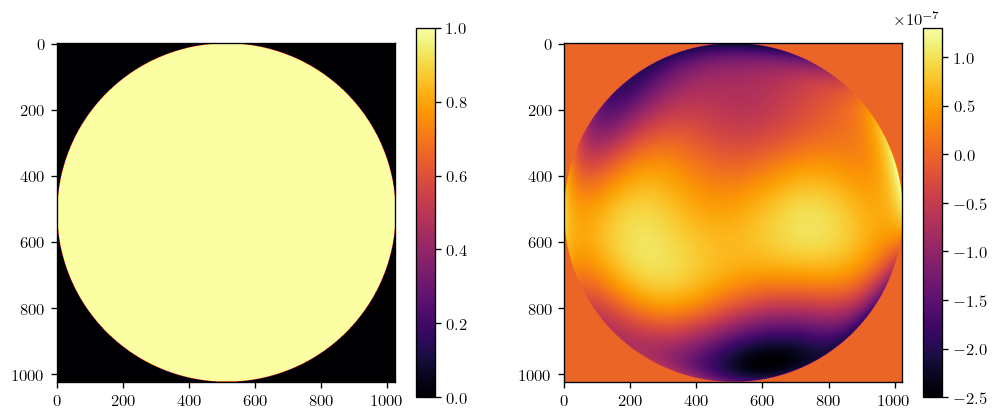

Plane 3: Detector plane: NIRCam detector (79x79 pixels, 0.063 arcsec / pix)



In [10]:
import numpy as onp
#planes = webb_osys.get_optical_system().planes
planes = webb_osys.optsys.planes

phasors = []
opds = []
ampls = []
i = 0

print(planes)

for p in planes:
    print("Plane {}: {}\n".format(i, p))
    
    #print(vars(p))
    
    #if hasattr(p, 'amplitude') and hasattr(p, 'opd'):
    #    if isinstance(p.opd, onp.ndarray) and p.opd.ndim == 2:
    
    if hasattr(p, 'opd') and \
        not isinstance(p.opd, int) and \
            len(p.opd.shape) == 2:

        plt.figure(figsize=(10, 4))
        plt.subplot(1, 2, 1)
        plt.imshow(p.amplitude)
        plt.colorbar()

        plt.subplot(1, 2, 2)
        plt.imshow(p.opd)
        plt.colorbar()
        plt.show()
        
    elif hasattr(p, 'transmission'):
        
        transission = p.transmission
        
        c = transission.shape[0]//2
        s = 256
        # print(i, "True")
        plt.figure(figsize=(10, 4))
        plt.subplot(1, 2, 1)
        plt.imshow(transission[c-s:c+s, c-s:c+s])
        plt.colorbar()
        
        plt.subplot(1, 2, 2)
        plt.imshow(np.zeros([1,1]))
        plt.colorbar()
        plt.show()
        
    i = i+1
                                              
# FPX     =             -1.16891 /                                                
# FPY     =            -0.767005 / 

In [11]:
from dLux.optics import OpticalLayer

class InvertY(OpticalLayer):
    def __init__(self):
        super().__init__("InvertY")

    def __call__(self, wavefront):
        return wavefront.invert_y()
    
class InvertX(OpticalLayer):
    def __init__(self):
        super().__init__("InvertX")

    def __call__(self, wavefront):
        return wavefront.invert_x()
    
class InvertXY(OpticalLayer):
    def __init__(self):
        super().__init__("InvertXY")

    def __call__(self, wavefront):
        return wavefront.invert_x_and_y()
    
class Pad(OpticalLayer):
    npix_out: int  

    def __init__(self, npix_out):
        self.npix_out = int(npix_out)
        super().__init__("Pad")
    
    def __call__(self, wavefront):
        return wavefront.pad_to(self.npix_out)
    
class Crop(OpticalLayer):
    npix_out: int   

    def __init__(self, npix_out):
        self.npix_out = int(npix_out)
        super().__init__("Crop")
    
    def __call__(self, wavefront):
        # Get relevant parameters
        return wavefront.crop_to(self.npix_out)


Array = np.ndarray
from dLux.detectors import DetectorLayer

    
from jax.scipy.ndimage import map_coordinates
from dLux.detectors import DetectorLayer


In [12]:
class NIRCamFieldAndWavelengthDependentAberration(OpticalLayer):
    opd: None
        
    zernike_coeffs: None
    defocus_zern: None
    tilt_zern: None
        
    focusmodel: None
    deltafocus: None
    opd_ref_focus: None
        
    ctilt_model: None
    tilt_offset: None
    tilt_ref_offset: None
    
    def __init__(self, instrument, opd, zernike_coeffs):
        super().__init__("NIRCamFieldAndWavelengthDependentAberration")
        
        self.opd = np.asarray(opd, dtype=float)
        self.zernike_coeffs = np.asarray(zernike_coeffs, dtype=float)
        
        # Check for coronagraphy
        pupil_mask = instrument._pupil_mask
        is_nrc_coron = (pupil_mask is not None) and ( ('LYOT' in pupil_mask.upper()) or ('MASK' in pupil_mask.upper()) )

        # Polynomial equations fit to defocus model. Wavelength-dependent focus 
        # results should correspond to Zernike coefficients in meters.
        # Fits were performed to the SW and LW optical design focus model 
        # as provided by Randal Telfer. 
        # See plot at https://github.com/spacetelescope/webbpsf/issues/179
        # The relative wavelength dependence of these focus models are very
        # similar for coronagraphic mode in the Zemax optical prescription,
        # so we opt to use the same focus model in both imaging and coronagraphy.
        defocus_to_rmswfe = -1.09746e7 # convert from mm defocus to meters (WFE)
        sw_focus_cf = np.array([-5.169185169, 50.62919436, -201.5444129, 415.9031962,  
                                -465.9818413, 265.843112, -59.64330811]) / defocus_to_rmswfe
        lw_focus_cf = np.array([0.175718713, -1.100964635, 0.986462016, 1.641692934]) / defocus_to_rmswfe

        # Coronagraphic tilt (`ctilt`) offset model
        # Primarily effects the LW channel (approximately a 0.031mm diff from 3.5um to 5.0um).
        # SW module is small compared to LW, but we include it for completeness.
        # Values have been determined using the Zernike offsets as reported in the 
        # NIRCam Zemax models. The center reference positions will correspond to the 
        # NIRCam target acquisition filters (3.35um for LW and 2.1um for SW)
        sw_ctilt_cf = np.array([125.849834, -289.018704]) / 1e9
        lw_ctilt_cf = np.array([146.827501, -2000.965222, 8385.546158, -11101.658322]) / 1e9

        # Get the representation of focus in the same Zernike basis as used for
        # making the OPD. While it looks like this does more work here than needed
        # by making a whole basis set, in fact because of caching behind the scenes
        # this is actually quick
        basis = poppy.zernike.zernike_basis_faster(
            nterms=len(self.zernike_coeffs),
            npix=self.opd.shape[0],
            outside=0
        )
        self.defocus_zern = np.asarray(basis[3])
        self.tilt_zern = np.asarray(basis[2])

        # Which wavelength was used to generate the OPD map we have already
        # created from zernikes?

        # Apply wavelength-dependent tilt offset for coronagraphy
        # We want the reference wavelength to be that of the target acq filter
        # Final offset will position TA ref wave at the OPD ref wave location
        #   (wave_um - opd_ref_wave) - (ta_ref_wave - opd_ref_wave) = wave_um - ta_ref_wave
        if instrument.channel.upper() == 'SHORT':
            self.focusmodel = sw_focus_cf
            opd_ref_wave = 2.12
        else:
            self.focusmodel = lw_focus_cf
            opd_ref_wave = 3.23
            
            if is_nrc_coron:
                self.opd_ref_focus = np.polyval(self.focusmodel, opd_ref_wave)
            else:
                self.opd_ref_focus = 1.206e-7 # Not coronagraphy (e.g., imaging)           
       
        # If F323N or F212N, then no focus offset necessary
        if ('F323N' in instrument.filter) or ('F212N' in instrument.filter):
            self.deltafocus = lambda wl: 0
        else:
            self.deltafocus = lambda wl: np.polyval(self.focusmodel, wl) - self.opd_ref_focus

    
        if is_nrc_coron:
            if instrument.channel.upper() == 'SHORT':
                self.ctilt_model = sw_ctilt_cf
                ta_ref_wave = 2.10
            else: 
                self.ctilt_model = lw_ctilt_cf
                ta_ref_wave = 3.35
            
            self.tilt_ref_offset = np.polyval(self.ctilt_model, ta_ref_wave)
        
            print("opd_ref_focus: {}", self.opd_ref_focus)
        
            print("tilt_ref_offset: {}", self.tilt_ref_offset)

            self.tilt_offset = lambda wl: np.polyval(self.ctilt_model, wl) - self.tilt_ref_offset
        else:
            self.tilt_ref_offset = None
            self.ctilt_model = None
            self.tilt_offset = lambda wl: 0
        
    def __call__(self, wavefront):
        
        wavelength = wavefront.wavelength * 1e6
        
        #jax.debug.print("wavelength: {}", wavelength)
        
        mod_opd = self.opd - self.deltafocus(wavelength) * self.defocus_zern
        mod_opd = mod_opd + self.tilt_offset(wavelength) * self.tilt_zern
        
        return wavefront.add_opd(mod_opd)
        

In [13]:
#generating source from fits file

head = webbpsf_fits[0].header
nwavels = head['NWAVES']
wavels, weights = [], []
for i in range(nwavels):
    wavels.append(head['WAVE'+str(i)])
    weights.append(head['WGHT'+str(i)])

spec = dl.ArraySpectrum(wavels, weights)
source = dl.PointSource(spectrum=spec)

In [14]:
webbpsf_fits[0].header

SIMPLE  =                    T / conforms to FITS standard                      
BITPIX  =                  -64 / array data type                                
NAXIS   =                    2 / number of array dimensions                     
NAXIS1  =                  316                                                  
NAXIS2  =                  316                                                  
EXTEND  =                    T                                                  
PLANE1  = 'Wavefront Intensity'                                                 
WAVELEN = 2.98203115618662E-06 / Weighted mean wavelength in meters             
DIFFLMT =  0.08833256135803114 / Diffraction limit lambda/D in arcsec           
OVERSAMP=                    4 / Oversampling factor for FFTs in computation    
DET_SAMP=                    4 / Oversampling factor for MFT to detector plane  
PIXELSCL=              0.01575 / Scale in arcsec/pix (after oversampling)       
FOV     =                4.9

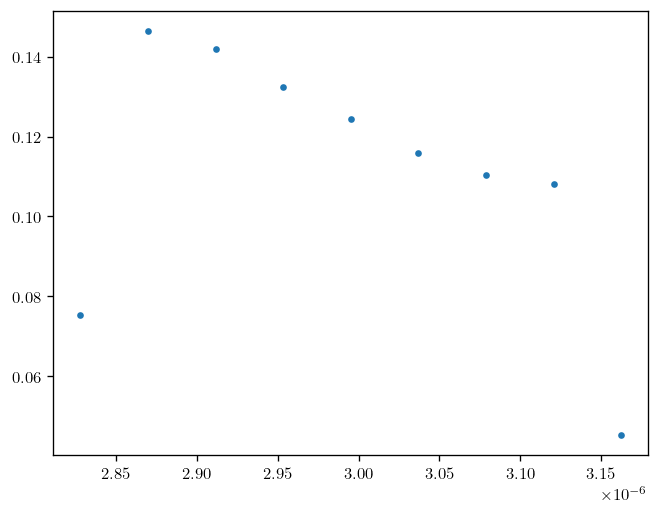

In [15]:
plt.plot(spec.wavelengths,spec.weights,'.')

In [16]:
# Get osys and planes
#webb_osys = get_nircam()

#nircam = webb_osys.get_optical_system()

nircam = webb_osys.optsys
pupil_plane = nircam.planes[0]
det_plane = nircam.planes[-1]

In [17]:
pupil_plane.pupil_diam

<Quantity 6.603464 m>

In [18]:
print(vars(nircam))

{'name': 'JWST+NIRCam', 'verbose': True, 'planes': [<webbpsf.opds.OTE_Linear_Model_WSS object at 0x16dcc22c0>, <poppy.poppy_core.CoordinateInversion object at 0x16dcc2740>, <webbpsf.optics.NIRCamFieldAndWavelengthDependentAberration object at 0x16dcc3d00>, <poppy.poppy_core.Detector object at 0x16dcc3cd0>], 'oversample': 4, 'npix': None, 'pupil_diameter': None, 'source_offset_r': 0, 'source_offset_theta': 0, 'intermediate_wfs': None}


In [19]:
# Wavefront 
npix = 1024
diameter = pupil_plane.pixelscale.to('m/pix').value * pupil_plane.npix
# diameter == 6.603464

# Aperture and OPD
webb_aper = nircam.planes[0].amplitude
webb_opd = nircam.planes[0].opd
pupil_mask = nircam.planes[3].amplitude

# Detector
det_npix = (det_plane.fov_pixels * det_plane.oversample).value
print(det_npix)
pscale = det_plane.pixelscale/det_plane.oversample
print(pscale)
pscale = pscale.to('radian/pix').value

# pscale == 7.958548e-08

# Make layers

def get_optical_layers(wavel):
    optical_layers = [

        #Plane 0: Pupil plane: JWST Entrance Pupil
        dl.CreateWavefront(npix, diameter, 'Angular'),
        dl.TransmissiveOptic(webb_aper),
        dl.AddOPD(webb_opd),

        #Plane 1: Coordinate Inversion in y axis
        InvertY(),

        #Plane 2: Pupil plane: NIRCamLWA internal WFE at V2V3=(1.46,-6.75)', near Z430R_A
        dl.TransmissiveOptic(nircam.planes[2].amplitude),
        NIRCamFieldAndWavelengthDependentAberration(webb_osys, nircam.planes[2].opd, nircam.planes[2].zernike_coeffs),
        

        #Plane 3: Detector plane: NIRCam detector (79x79 pixels, 0.063 arcsec / pix)
        dl.AngularMFT(det_npix, pscale),
    ]            
    return optical_layers

optical_layers = get_optical_layers(wavels[0])

optics = dl.Optics(optical_layers)

telescope = dl.Instrument(optics, source)

@jit
def model_optics_jit():
    return telescope.model()

316.0
0.01575 arcsec / pix


In [20]:
%%time
print("Modelling optics...")
psf = model_optics_jit()
print("Modelling optics...ok")
psf_norm = psf/psf.sum()
webbpsf_norm = webbpsf_data/webbpsf_data.sum()

norm = colors.LogNorm(vmin=1e-10, vmax=1e-5)
vmin = 1e-10
vmax = 1e-5
ticks = np.logspace(np.log10(vmin), np.log10(vmax), int(np.round(np.log10(vmax / vmin) + 1)))



Modelling optics...
Modelling optics...ok
CPU times: user 6.91 s, sys: 229 ms, total: 7.14 s
Wall time: 1.64 s


Text summary:
Plane 0
  CreateWavefront: Creates a Angular wavefront of size 1024 pixels and diameter 6.603464 m.
  TransmissiveOptic_0: Applies an array of tranmission values to the Wavefront.
  AddOPD: Add an array of Optical Path Differences (OPD) to the wavefront.
  InvertY layer has no summary method yet.
  TransmissiveOptic_1: Applies an array of tranmission values to the Wavefront.
  NIRCamFieldAndWavelengthDependentAberration layer has no summary method yet.
  Propagates the Wavefront to a focal plane with 316x316 pixels of size 0.01575 arcseconds using a 2-sided MFT.


Plane 0
  CreateWavefront: Creates a Angular wavefront of size 1024 pixels and diameter 6.603464 m.


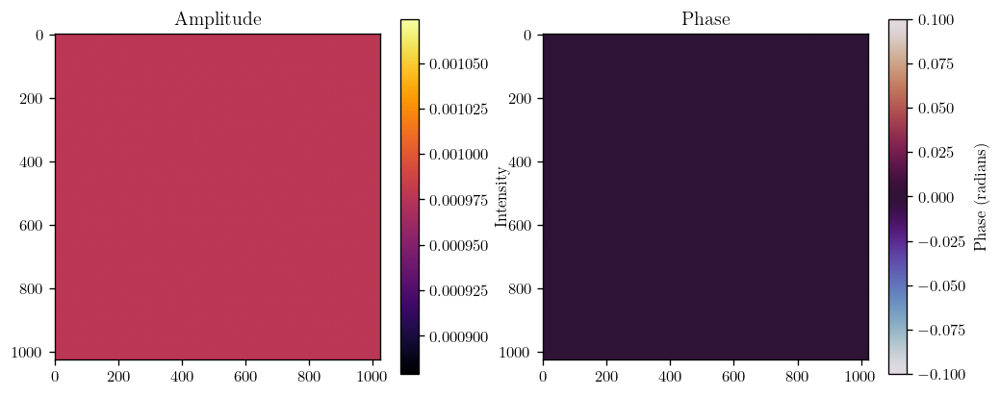

  TransmissiveOptic_0: Applies an array of tranmission values to the Wavefront.


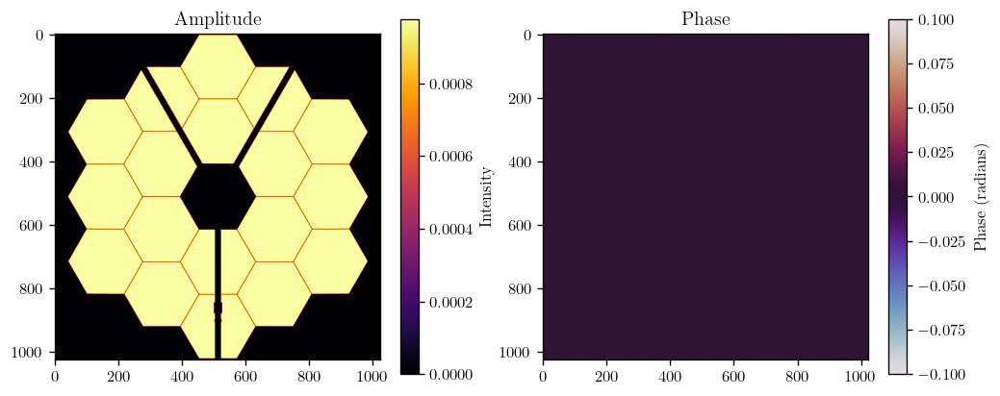

  AddOPD: Add an array of Optical Path Differences (OPD) to the wavefront.


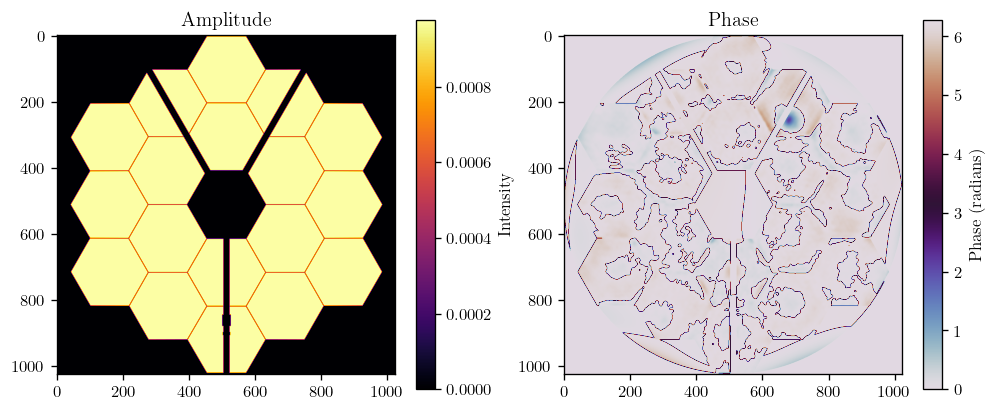

  InvertY layer has no summary method yet.


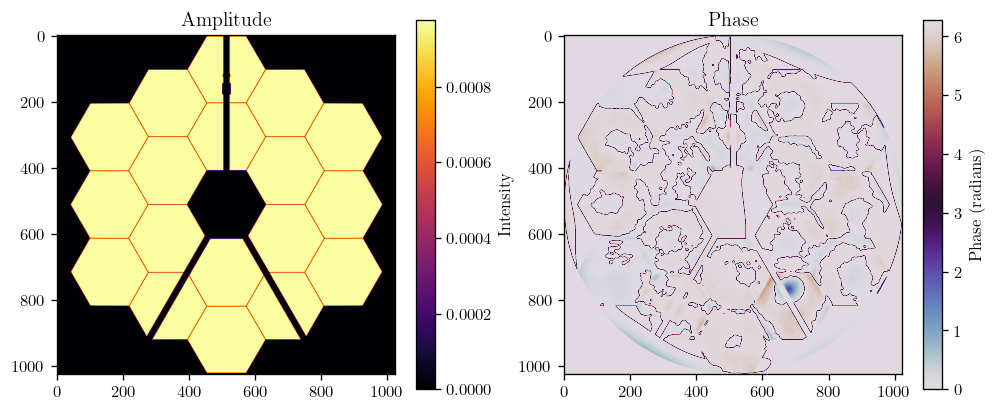

  TransmissiveOptic_1: Applies an array of tranmission values to the Wavefront.


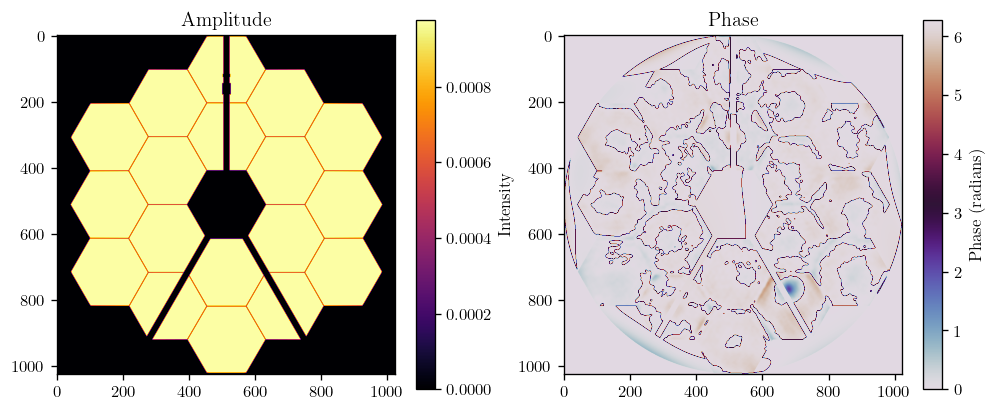

  NIRCamFieldAndWavelengthDependentAberration layer has no summary method yet.


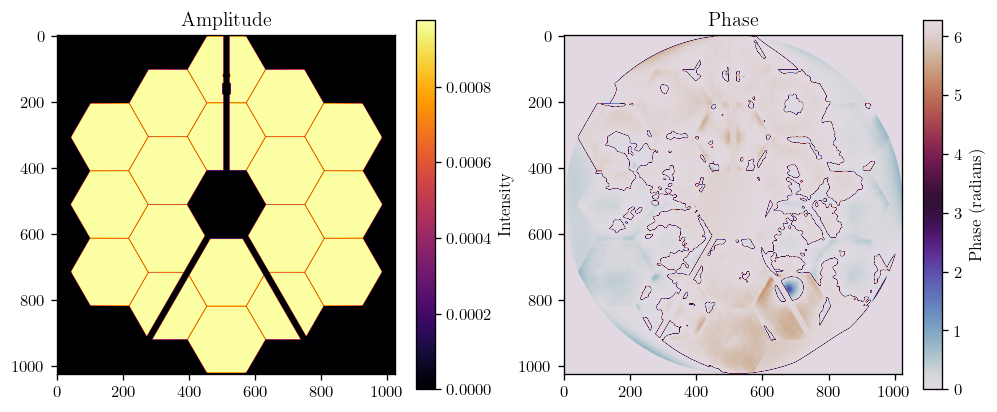

  Propagates the Wavefront to a focal plane with 316x316 pixels of size 7.636e-08 radians using a 2-sided MFT.


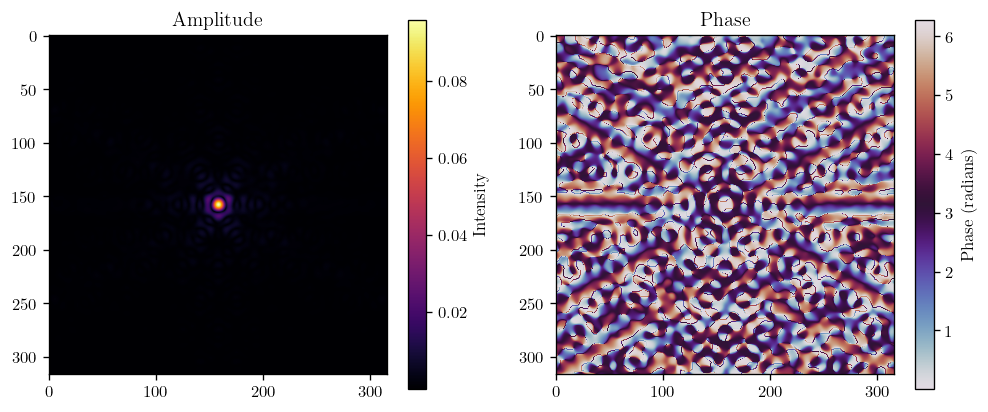

AngularWavefront(
  wavelength=f64[],
  pixel_scale=f64[],
  plane_type=<PlaneType.Focal: 2>,
  amplitude=f64[1,316,316],
  phase=f64[1,316,316]
)

In [21]:
optics.plot(3.0e-6)

4.85722573273506e-17


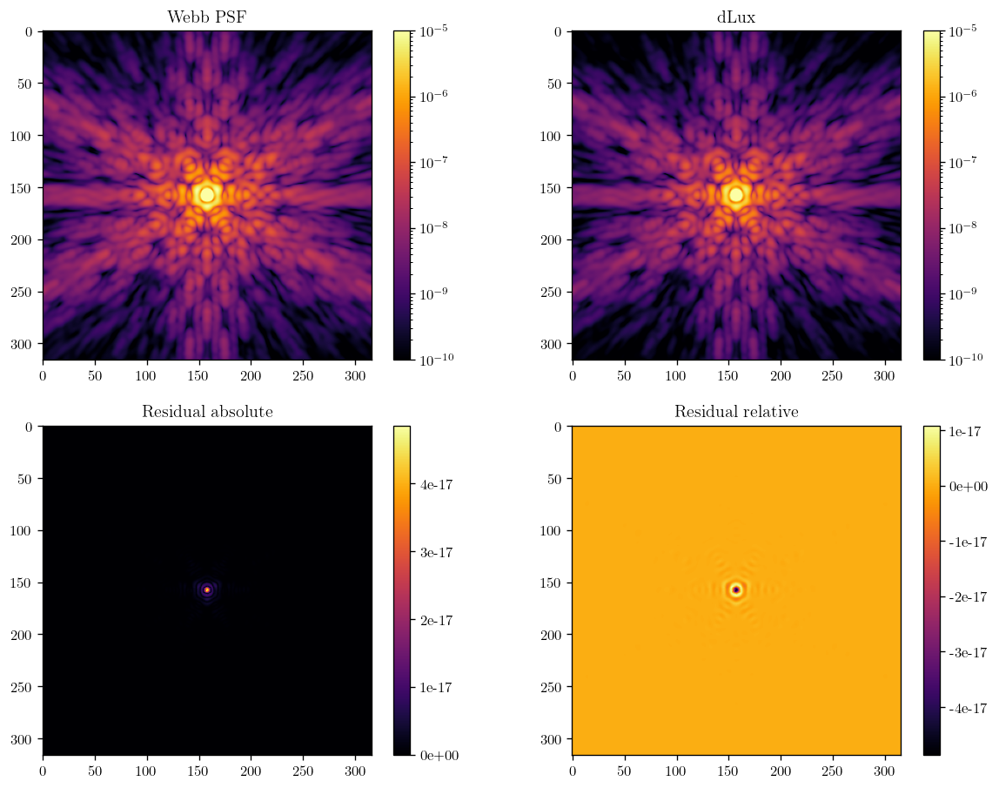

In [22]:
plt.figure(figsize=(12, 9))

plt.subplot(2, 2, 1)
plt.title("Webb PSF")
plt.imshow(webbpsf_data/100, norm=norm)
bar1 = plt.colorbar()
#bar1.set_ticks(ticks)
#bar1.set_ticklabels(ticks)

plt.subplot(2, 2, 2)
plt.title("dLux")
plt.imshow(psf/100, norm=norm)
bar2 = plt.colorbar()
#bar2.set_ticks(ticks)
#bar2.set_ticklabels(ticks)

plt.subplot(2, 2, 3)
plt.title("Residual absolute")
plt.imshow(abs(webbpsf_norm - psf_norm))
# plt.imshow(webbpsf_norm/psf_norm)
plt.colorbar(format='%.0e')

plt.subplot(2, 2, 4)
plt.title("Residual relative")
plt.imshow(webbpsf_norm - psf_norm)
# plt.imshow(webbpsf_norm/psf_norm)
plt.colorbar(format='%.0e')

mse = (np.sqrt((webbpsf_norm - psf_norm)**2)).max()
print(mse)

## Phase retrieval 

In [23]:
def gen_JWST_mask_basis(nterms, npix, instrument):
    import poppy
    import numpy as onp
    
    ins_osys = instrument.get_optical_system()
    seg_cens = ins_osys.planes[0]._seg_centers_m
    pscale = ins_osys.planes[0].pixelscale.value * 1024 / npix
    
    # Scale mask
    pupil = ins_osys.planes[0].amplitude
    mask = dl.utils.scale_array(pupil, npix, 1)
    
    # Hard-coded scaling params
    diam = 1.32 * 1.001
    
    # Gen basis
    bases = []
    for key in seg_cens.keys():
        xcen, ycen = - seg_cens[key]
        rho, theta = onp.array(dl.utils.get_pixel_positions((npix,npix) , pscale, (xcen, ycen), polar=True))
        bases.append(poppy.zernike.hexike_basis(1, npix, diam*rho, theta, outside=0.))
        # ap = poppy.zernike.hex_aperture(npix, diam*rho, theta)
    return mask, np.array(bases)

In [24]:
npix_basis = 1024

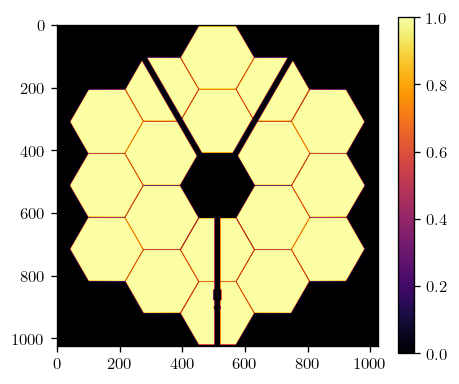

In [25]:
nircam = webbpsf.NIRCam()
mask, basis = gen_JWST_mask_basis(10, npix_basis, nircam)

sample_basis = mask*basis.sum(0)
plt.figure(figsize=(25, 8))
for i in range(len(basis[0])):
    plt.subplot(2, 5, i+1)
    plt.imshow(sample_basis[i])
    plt.colorbar()
plt.show()

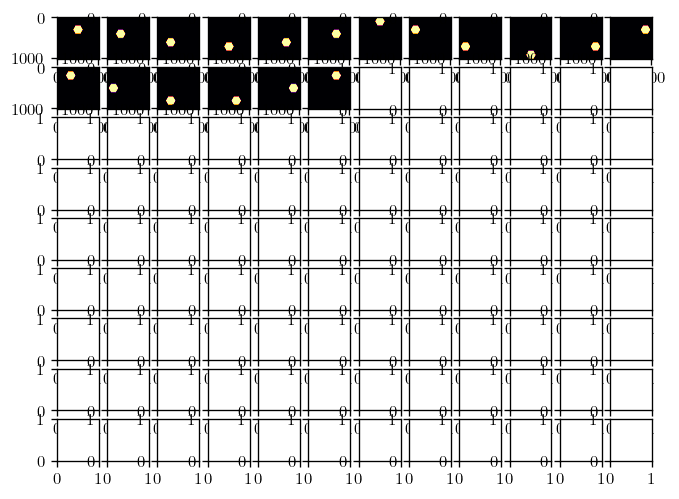

In [26]:
fig, axes = plt.subplots(9,12)

basis_flat = basis.reshape((1*18, npix_basis, npix_basis))

for j in range(basis_flat.shape[0]):
    ax = axes.ravel()[j]
    ax.imshow(basis_flat[j,:,:])

In [128]:
fix_n = 10

In [129]:
seed = 0xDEFDBE3F
coeffs = 2e-8*jr.normal(jr.PRNGKey(seed), (basis_flat.shape[0],))
coeffs = coeffs.at[fix_n].set(0)

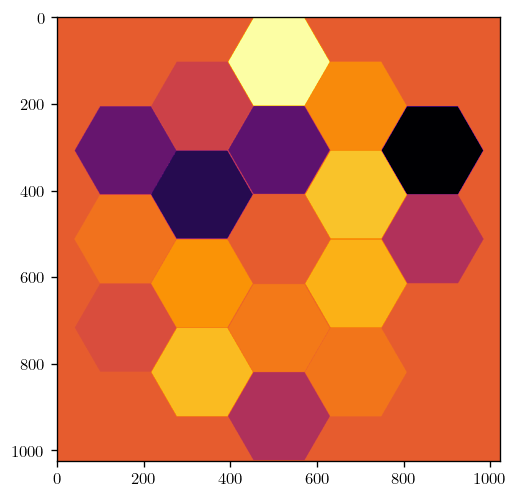

In [130]:
def get_aber(coeffs, basis):
    coeffs_reshaped = coeffs.reshape(coeffs.shape[0], 1, 1)
    s_coeffs = np.asarray(coeffs.reshape(coeffs.shape[0], 1, 1), dtype=float)
    s_basis = np.asarray(basis, dtype=float)
    result = s_coeffs * s_basis
    return result.sum(0)

base_aberrations = get_aber(coeffs, basis_flat)
plt.imshow(base_aberrations)

In [131]:
base_aberrations.shape

(1024, 1024)

In [132]:
class JWST_basis(OpticalLayer):
    
    basis: None
    coeffs_base: None
    coeffs_model: None
    fix_n: None
    
    def __init__(self, basis, coeffs, fix_n=0):
        super().__init__("JWST_basis")
        
        self.basis = np.asarray(basis, dtype=float)
        self.coeffs_base = np.asarray(coeffs, dtype=float)
        coeffs_model = np.asarray(coeffs, dtype=float)
        self.coeffs_model = np.concatenate((coeffs_model[:fix_n], coeffs_model[fix_n+1:]))
        self.coeffs_base = self.coeffs_base.at[fix_n].set(0)
        self.fix_n = fix_n
    
    @property
    def coeffs(self):
        return np.concatenate((self.coeffs_model[:fix_n], self.coeffs_base[fix_n:fix_n+1], self.coeffs_model[fix_n:]))

    def __call__(self, wavefront):
        coeffs_reshaped = self.coeffs.reshape(self.coeffs_base.shape[0], 1, 1)
        
        opd_arr = self.basis * coeffs_reshaped
        opd = opd_arr.sum(0)
        
        return wavefront.add_opd(opd)
    

In [133]:
#a = np.ones(10)
#b = np.zeros(9)

#def get_c(a, b, n):
#    return np.concatenate((b[:n], a[n:n+1], b[n:]))

#print(get_c(a, b, 5))

In [134]:
#webb_osys = get_nircam()
nircam = webb_osys.optsys
pupil_plane = nircam.planes[0]
det_plane = nircam.planes[-1]

In [135]:
# Wavefront 
npix = 1024
diameter = pupil_plane.pixelscale.to('m/pix').value * pupil_plane.npix
# diameter == 6.603464

# Aperture and OPD
webb_aper = nircam.planes[0].amplitude
webb_opd = nircam.planes[0].opd
pupil_mask = nircam.planes[3].amplitude

# Detector
det_npix = (det_plane.fov_pixels * det_plane.oversample).value
print(det_npix)
pscale = det_plane.pixelscale/det_plane.oversample
print(pscale)
pscale = pscale.to('radian/pix').value

# pscale == 7.958548e-08

# Make layers

def get_optical_layers():
    optical_layers = [
        
        
        #Plane 0: Pupil plane: JWST Entrance Pupil
        dl.CreateWavefront(npix, diameter, 'Angular'),
        dl.TransmissiveOptic(webb_aper),
        dl.AddOPD(webb_opd),
        JWST_basis(basis_flat, coeffs, fix_n),

        #Plane 1: Coordinate Inversion in y axis
        InvertY(),

        #Plane 2: Pupil plane: NIRCamLWA internal WFE at V2V3=(1.46,-6.75)', near Z430R_A
        #dl.AddOPD(nircam.planes[4].get_opd(wavel)),
        dl.TransmissiveOptic(nircam.planes[2].amplitude),
        NIRCamFieldAndWavelengthDependentAberration(webb_osys, nircam.planes[2].opd, nircam.planes[2].zernike_coeffs),
        

        #Plane 3: Detector plane: NIRCam detector (79x79 pixels, 0.063 arcsec / pix)
        dl.AngularMFT(det_npix, pscale),         
        
    ]
    return optical_layers

optical_layers = get_optical_layers()

optics = dl.Optics(optical_layers)

telescope = dl.Instrument(optics, source)

@jit
def model_optics_jit():
    return telescope.model()


316.0
0.01575 arcsec / pix


In [136]:
%%time
print("Modelling optics...")
psf = model_optics_jit()
print("Modelling optics...ok")
psf_norm = psf/psf.sum()
webbpsf_norm = webbpsf_data/webbpsf_data.sum()

norm = colors.LogNorm(vmin=1e-10, vmax=1e-5)
vmin = 1e-10
vmax = 1e-5
ticks = np.logspace(np.log10(vmin), np.log10(vmax), int(np.round(np.log10(vmax / vmin) + 1)))

Modelling optics...
Modelling optics...ok
CPU times: user 11.4 s, sys: 6.55 s, total: 17.9 s
Wall time: 4.92 s


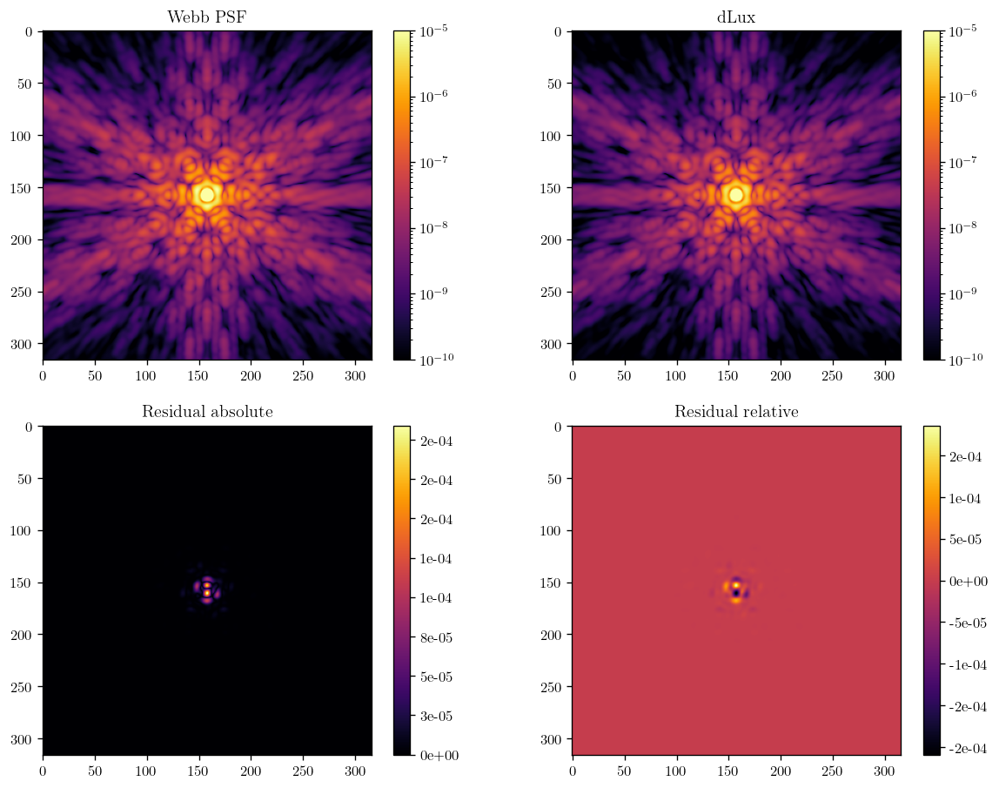

In [137]:
plt.figure(figsize=(12, 9))

plt.subplot(2, 2, 1)
plt.title("Webb PSF")
plt.imshow(webbpsf_data/100, norm=norm)
bar1 = plt.colorbar()
#bar1.set_ticks(ticks)
#bar1.set_ticklabels(ticks)

plt.subplot(2, 2, 2)
plt.title("dLux")
plt.imshow(psf/100, norm=norm)
bar2 = plt.colorbar()
#bar2.set_ticks(ticks)
#bar2.set_ticklabels(ticks)

plt.subplot(2, 2, 3)
plt.title("Residual absolute")
plt.imshow(abs(webbpsf_norm - psf_norm))
# plt.imshow(webbpsf_norm/psf_norm)
plt.colorbar(format='%.0e')

plt.subplot(2, 2, 4)
plt.title("Residual relative")
plt.imshow(webbpsf_norm - psf_norm)
# plt.imshow(webbpsf_norm/psf_norm)
plt.colorbar(format='%.0e')


In [174]:
initial_seed = 0xBED145

# Define path to the zernikes
zernikes = 'JWST_basis.coeffs_model'

# Generate new random set of zernikes
coeffs_init_random = 2e-8*jr.normal(jr.PRNGKey(initial_seed), (basis_flat.shape[0],))
#coeffs_init = np.asarray(coeffs_init.reshape(coeffs_init.shape[0], 1, 1), dtype=float)

def set_rand(coeffs, coeffs_rand, rand_n):
    for n in rand_n:
        coeffs = coeffs.at[n].set(coeffs_rand[n])
    return coeffs

coeffs_init = set_rand(coeffs, coeffs_init_random, [2,8,17])

# Generate a new model with updated zernike coefficients

#telescope.set('JWST_basis.coeffs_base', np.zeros(basis_flat.shape[0]))
#model = telescope.set(zernikes, coeffs_init[1:])

model = telescope.set(zernikes, np.concatenate((coeffs_init[:fix_n], coeffs_init[fix_n+1:])))

In [207]:
def set_fixed(coeffs, coeffs_rand, fix_n):
    for n in fix_n:
        coeffs_rand = coeffs_rand.at[n].set(coeffs[n])
    return coeffs_rand


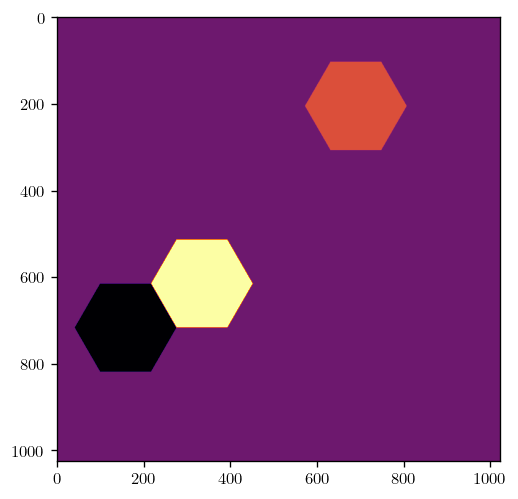

In [175]:
plt.imshow(base_aberrations - get_aber(coeffs_init, basis_flat))

In [176]:
@zdx.filter_jit
@zdx.filter_value_and_grad(zernikes)
def loss_func(model, data):
    out = model.model()
    return -np.sum(jax.scipy.stats.poisson.logpmf(data, out))

In [177]:
-np.sum(jax.scipy.stats.poisson.logpmf(psf, psf))

Array(4.21515917, dtype=float64)

In [178]:
%%time
loss, initial_grads = loss_func(model, psf) # Compile
print("Initial Loss: {}".format(loss))

Initial Loss: 4.215443432990331
CPU times: user 12 s, sys: 307 ms, total: 12.4 s
Wall time: 2.66 s


In [179]:
#%%timeit
#loss = loss_func(model, psf)[0].block_until_ready()

In [180]:
optim, opt_state = zdx.get_optimiser(model, [zernikes], [optax.adam(2e-9)])

losses, models_out = [], []
#prev_loss = 1e10
#delta_loss = 1e-10
with tqdm(range(50), desc='Gradient Descent') as t:
    for i in t: 
        # calculate the loss and gradient
        loss, grads = loss_func(model, psf)
        
        # apply the update
        updates, opt_state = optim.update(grads, opt_state)
        model = zdx.apply_updates(model, updates)
        
        # save results
        models_out.append(model) 
        losses.append(loss)
        
        #if abs(prev_loss - loss) <= delta_loss:
        #    break
            
        #prev_loss = loss
        
        t.set_description('Loss %.7f' % (loss)) # update the progress bar
final_psf = model.model()

Gradient Descent:   0%|          | 0/50 [00:00<?, ?it/s]

In [181]:
model_basis = np.asarray((model.JWST_basis.basis).reshape((nzern*18, npix_basis, npix_basis)), dtype=float)
model_coeffs = np.asarray((model.JWST_basis.coeffs).reshape(model.JWST_basis.coeffs.shape[0], 1, 1), dtype=float)
model_result = model_coeffs* model_basis
model_result.sum(0).shape

(1024, 1024)

In [182]:
cmap = colormaps['seismic']
cmap.set_bad('k',1.)

In [183]:
#model_pistons = model_coeffs.reshape(108,)[np.arange(108)%6 == 0]
#pistons = coeffs_init.reshape(108,)[np.arange(108)%6 == 0]

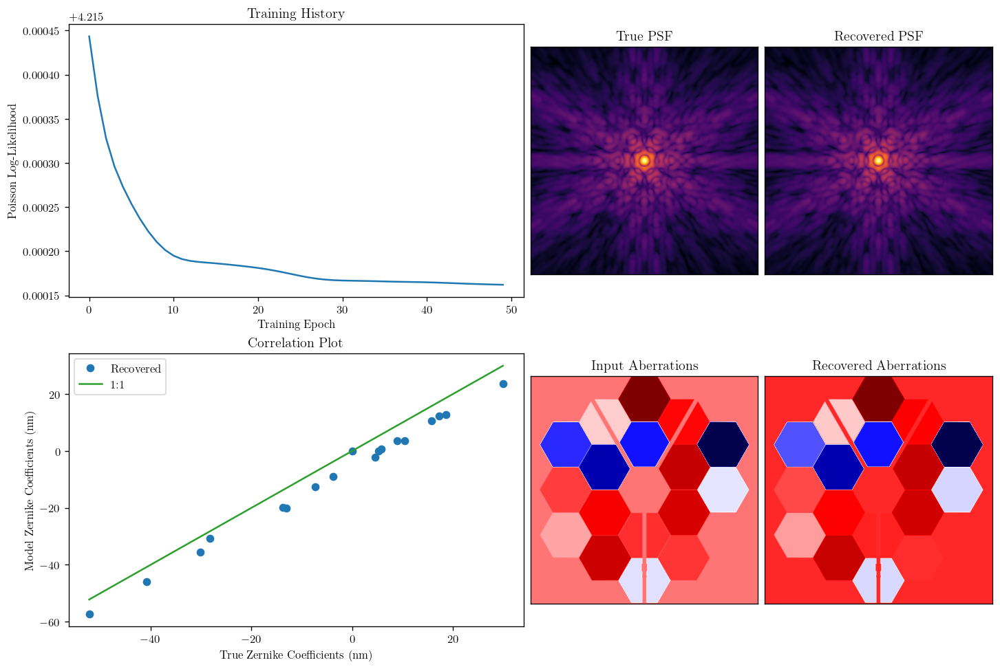

In [189]:
coeffs_out = np.array([model_out.get(zernikes) for model_out in models_out])

mosaic = """
    AABD
    GGEF
    """

fig = plt.figure(constrained_layout=True,figsize=(12, 8))
axes = fig.subplot_mosaic(mosaic)

for ax in ['B','D','E','F']:
    axes[ax].set_xticks([])
    axes[ax].set_yticks([])

axes['A'].plot(np.array(losses))
axes['A'].set_title("Training History")
axes['A'].set_xlabel('Training Epoch')
axes['A'].set_ylabel('Poisson Log-Likelihood')

axes['B'].imshow(psf**0.1)
axes['B'].set_title('True PSF')

axes['G'].plot(coeffs*1e9,model_coeffs.reshape(18,)*1e9,'.',markersize=12,color='C0',label='Recovered')
#axes['G'].plot(coeffs*1e9,coeffs_init.reshape(18,)*1e9,'.',markersize=12,color='C1',label='Initial')

axes['G'].plot(np.array([np.min(coeffs),np.max(coeffs)])*1e9,
               np.array([np.min(coeffs),np.max(coeffs)])*1e9,
               '-',color='C2',label='1:1')
axes['G'].legend()
axes['G'].set_title('Correlation Plot ')
axes['G'].set_xlabel('True Zernike Coefficients (nm)')
axes['G'].set_ylabel('Model Zernike Coefficients (nm)')

axes['D'].imshow(final_psf**0.1)
axes['D'].set_title('Recovered PSF')

axes['E'].imshow(mask*base_aberrations, cmap=cmap)
axes['E'].set_title('Input Aberrations')

axes['F'].imshow(mask*model_result.sum(0), cmap=cmap)
axes['F'].set_title('Recovered Aberrations')
plt.show()

In [185]:
input_mask = (np.where(mask==0, np.nan, mask))

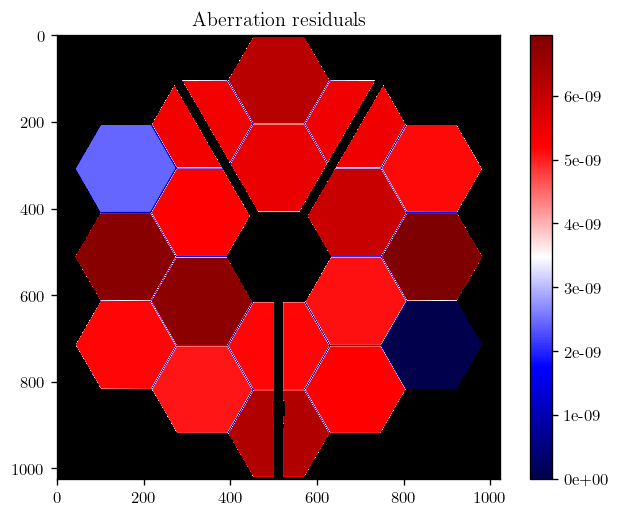

In [188]:
data = input_mask*(base_aberrations - model_result.sum(0))

cmap1 = colormaps['seismic']
cmap1.set_bad('k',1.)
val_max = np.max(np.abs(base_aberrations - model_result.sum(0)))
norm1 = colors.TwoSlopeNorm(vmin=-val_max, vmax=val_max, vcenter=0)

plt.imshow(mask*data, cmap=cmap1)#, norm=norm1)
plt.title('Aberration residuals')
plt.colorbar(format='%.0e')


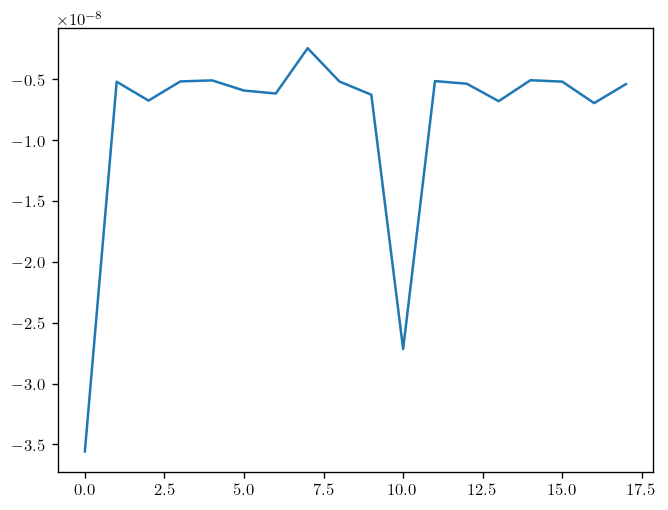

In [187]:
plt.plot((model_coeffs - s_coeffs).reshape(18,1,))

In [152]:
(model_coeffs - s_coeffs)

Array([[[-2.56878092e-08]],

       [[ 3.59133649e-09]],

       [[ 7.18913243e-09]],

       [[ 4.77704077e-09]],

       [[ 3.67225198e-09]],

       [[ 7.50709069e-09]],

       [[ 3.08530081e-09]],

       [[-1.11898422e-09]],

       [[ 3.73604607e-09]],

       [[ 3.60690336e-09]],

       [[-2.71599983e-08]],

       [[ 3.55949262e-09]],

       [[ 4.62165751e-09]],

       [[ 5.38254261e-09]],

       [[ 3.21593877e-09]],

       [[ 4.15994730e-09]],

       [[ 5.49379322e-09]],

       [[ 3.76162674e-09]]], dtype=float64)

316.0
0.01575 arcsec / pix
Modeling mirror 0
opd_ref_focus: {} 6.714345736893632e-08
tilt_ref_offset: {} 5.412406381286715e-08
Modelling optics...
Modelling optics...ok


Gradient Descent:   0%|          | 0/100 [00:00<?, ?it/s]

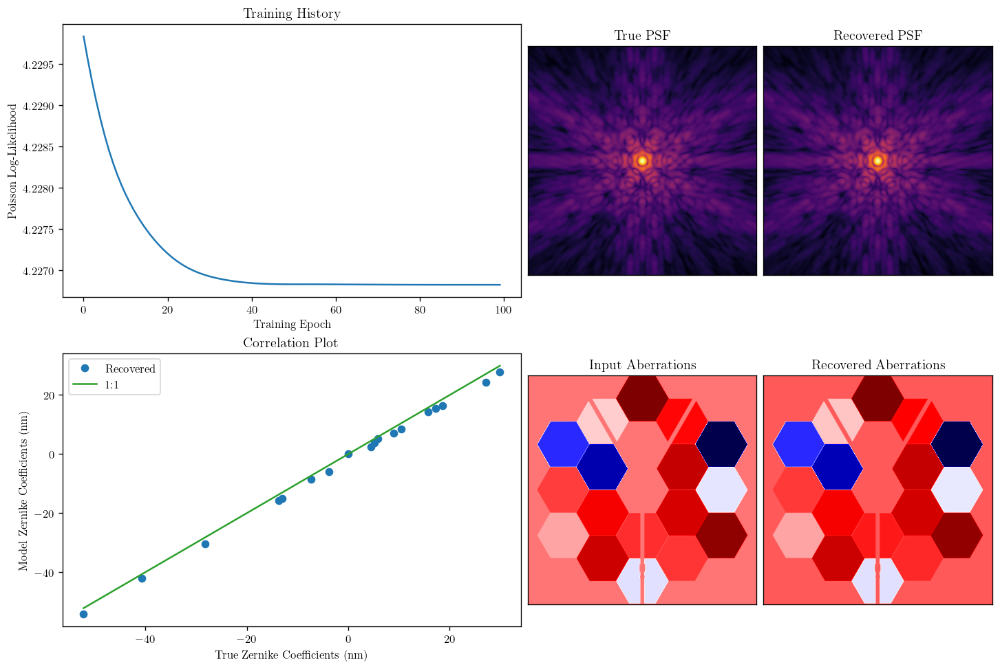

316.0
0.01575 arcsec / pix
Modeling mirror 1
opd_ref_focus: {} 6.714345736893632e-08
tilt_ref_offset: {} 5.412406381286715e-08
Modelling optics...
Modelling optics...ok


Gradient Descent:   0%|          | 0/100 [00:00<?, ?it/s]

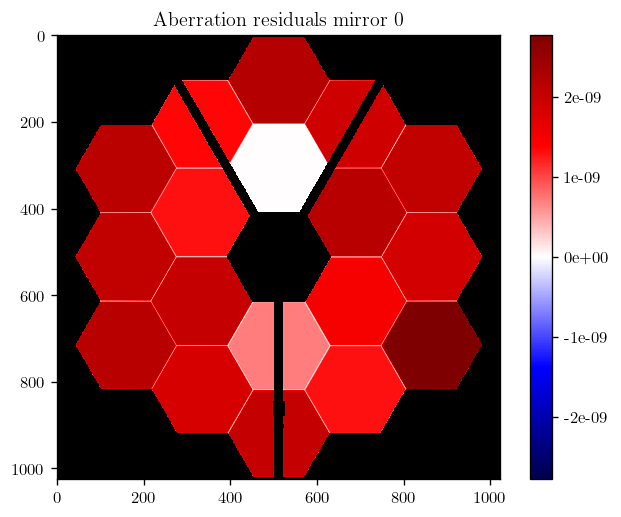

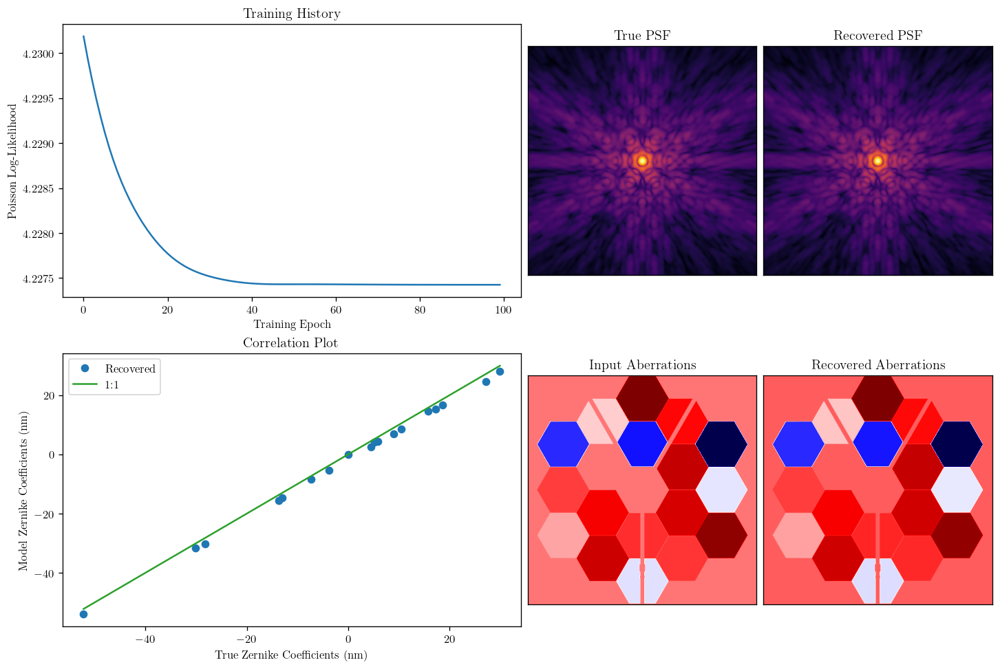

316.0
0.01575 arcsec / pix
Modeling mirror 2
opd_ref_focus: {} 6.714345736893632e-08
tilt_ref_offset: {} 5.412406381286715e-08
Modelling optics...
Modelling optics...ok


Gradient Descent:   0%|          | 0/100 [00:00<?, ?it/s]

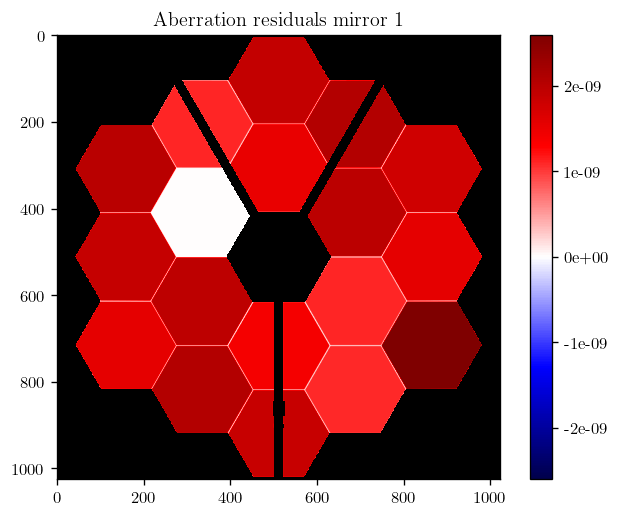

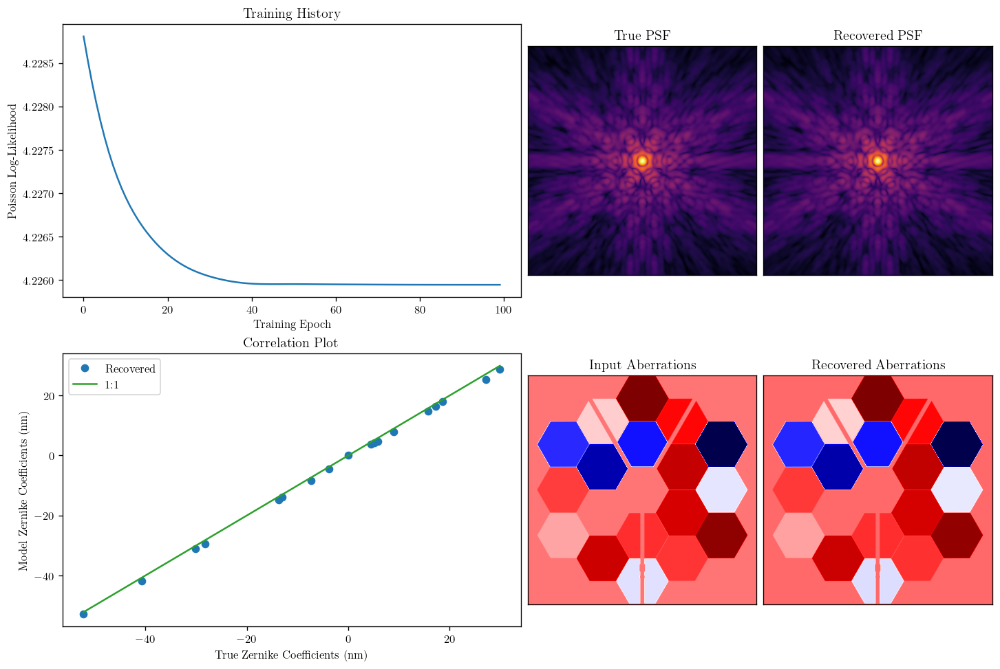

316.0
0.01575 arcsec / pix
Modeling mirror 3
opd_ref_focus: {} 6.714345736893632e-08
tilt_ref_offset: {} 5.412406381286715e-08
Modelling optics...
Modelling optics...ok


Gradient Descent:   0%|          | 0/100 [00:00<?, ?it/s]

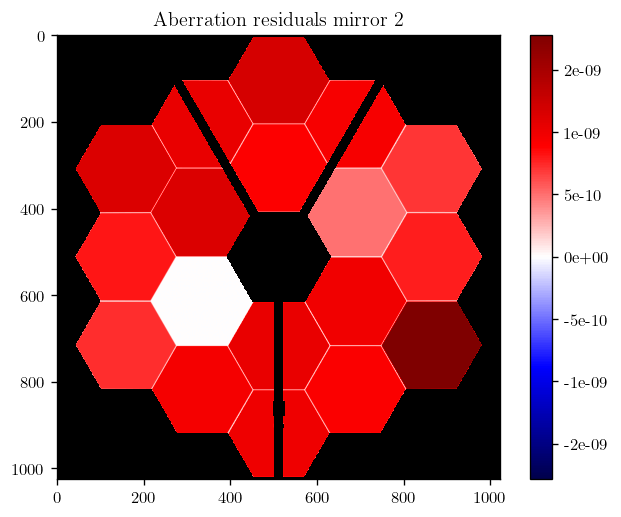

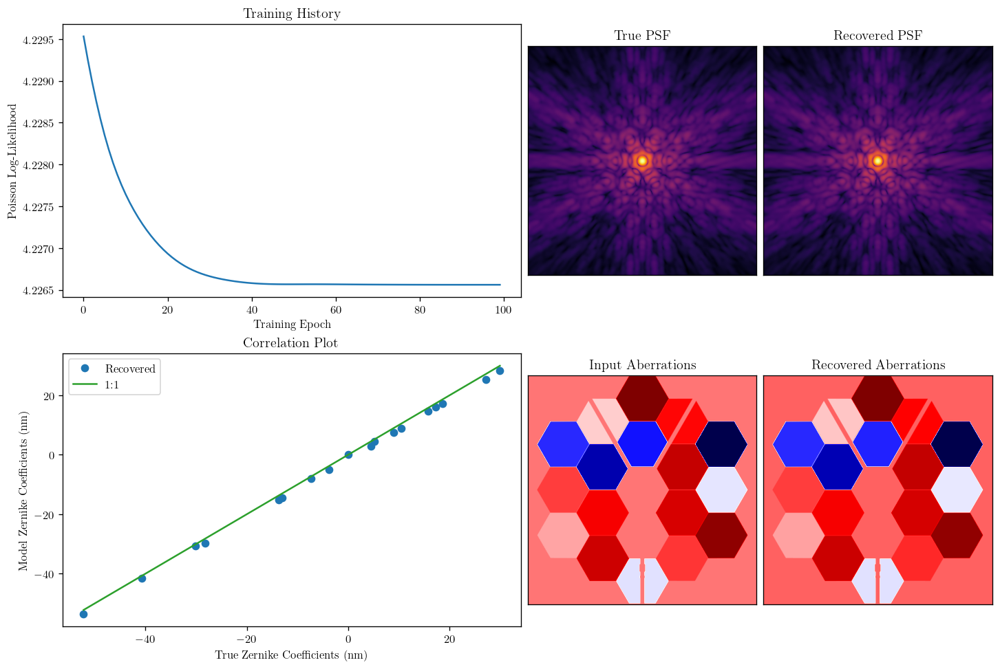

316.0
0.01575 arcsec / pix
Modeling mirror 4
opd_ref_focus: {} 6.714345736893632e-08
tilt_ref_offset: {} 5.412406381286715e-08
Modelling optics...


2023-04-27 12:52:56.935629: E external/xla/xla/service/slow_operation_alarm.cc:65] Constant folding an instruction is taking > 2s:

  reduce.118 (displaying the full instruction incurs a runtime overhead. Raise your logging level to 4 or above).

This isn't necessarily a bug; constant-folding is inherently a trade-off between compilation time and speed at runtime. XLA has some guards that attempt to keep constant folding from taking too long, but fundamentally you'll always be able to come up with an input program that takes a long time.

If you'd like to file a bug, run with envvar XLA_FLAGS=--xla_dump_to=/tmp/foo and attach the results.
2023-04-27 12:52:57.119743: E external/xla/xla/service/slow_operation_alarm.cc:133] The operation took 2.189092s
Constant folding an instruction is taking > 2s:

  reduce.118 (displaying the full instruction incurs a runtime overhead. Raise your logging level to 4 or above).

This isn't necessarily a bug; constant-folding is inherently a trade-off bet

Modelling optics...ok


Gradient Descent:   0%|          | 0/100 [00:00<?, ?it/s]

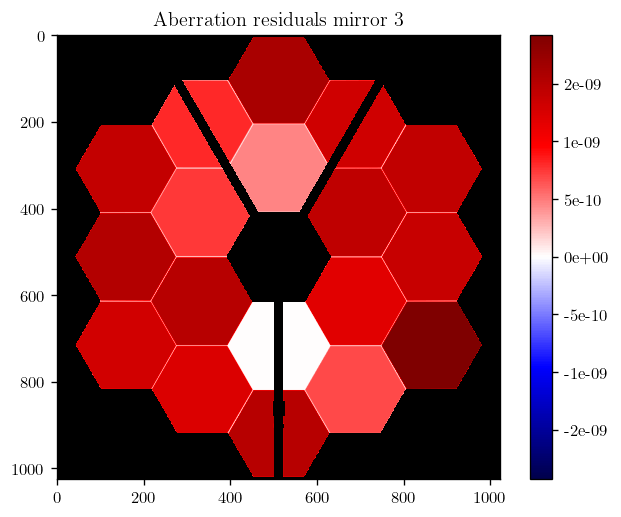

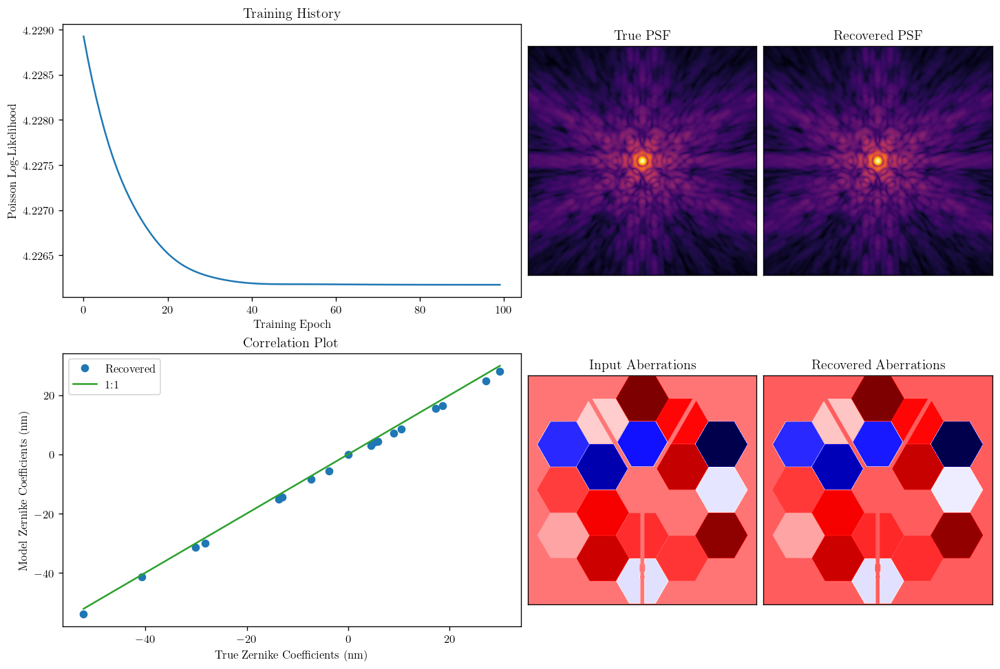

316.0
0.01575 arcsec / pix
Modeling mirror 5
opd_ref_focus: {} 6.714345736893632e-08
tilt_ref_offset: {} 5.412406381286715e-08
Modelling optics...
Modelling optics...ok


Gradient Descent:   0%|          | 0/100 [00:00<?, ?it/s]

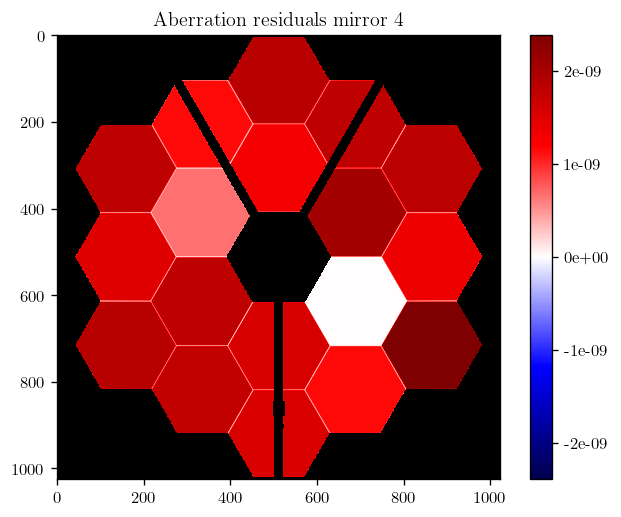

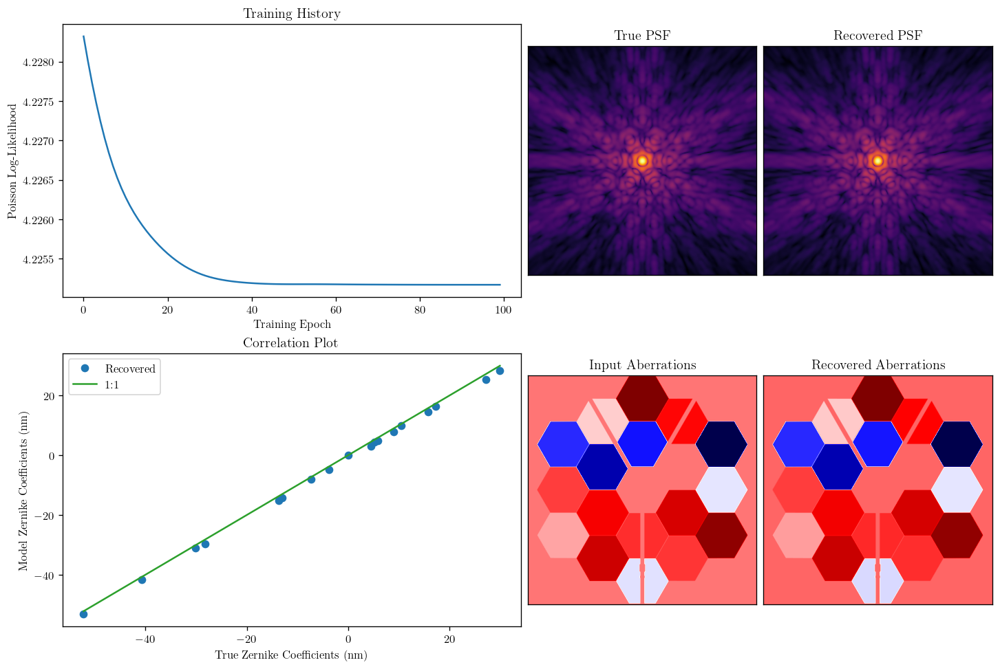

316.0
0.01575 arcsec / pix
Modeling mirror 6
opd_ref_focus: {} 6.714345736893632e-08
tilt_ref_offset: {} 5.412406381286715e-08
Modelling optics...
Modelling optics...ok


Gradient Descent:   0%|          | 0/100 [00:00<?, ?it/s]

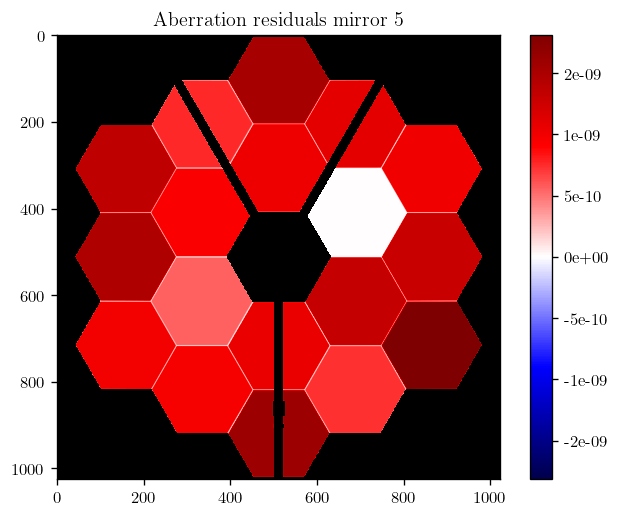

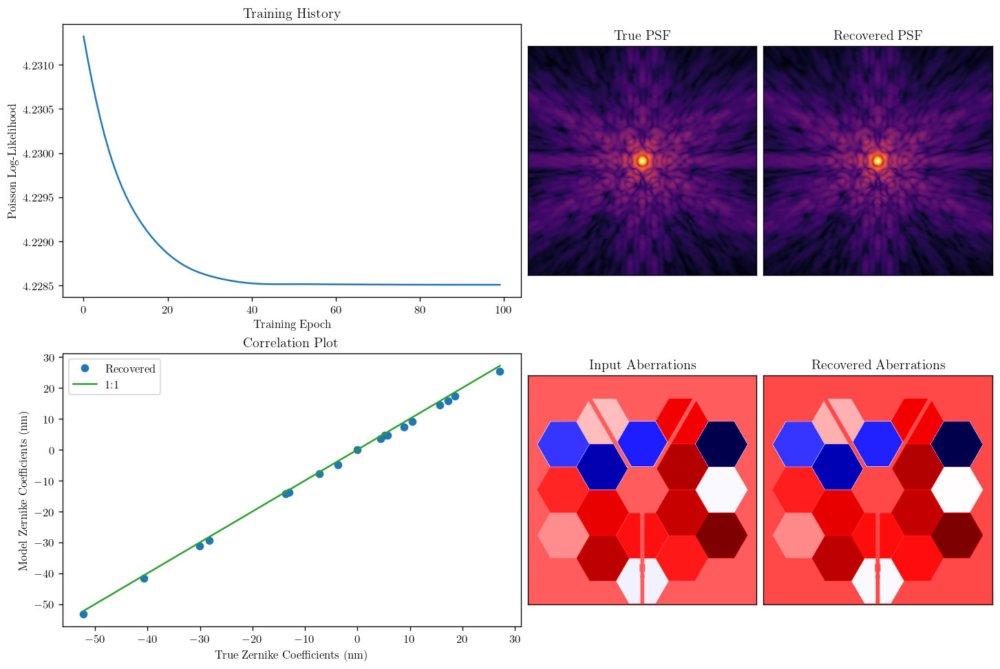

316.0
0.01575 arcsec / pix
Modeling mirror 7
opd_ref_focus: {} 6.714345736893632e-08
tilt_ref_offset: {} 5.412406381286715e-08
Modelling optics...
Modelling optics...ok


Gradient Descent:   0%|          | 0/100 [00:00<?, ?it/s]

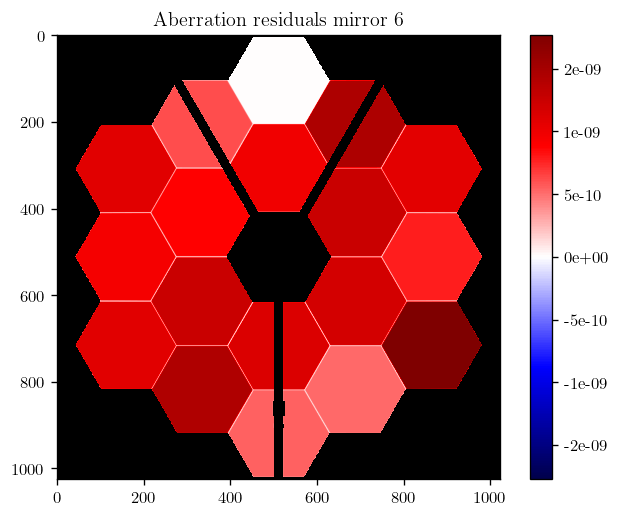

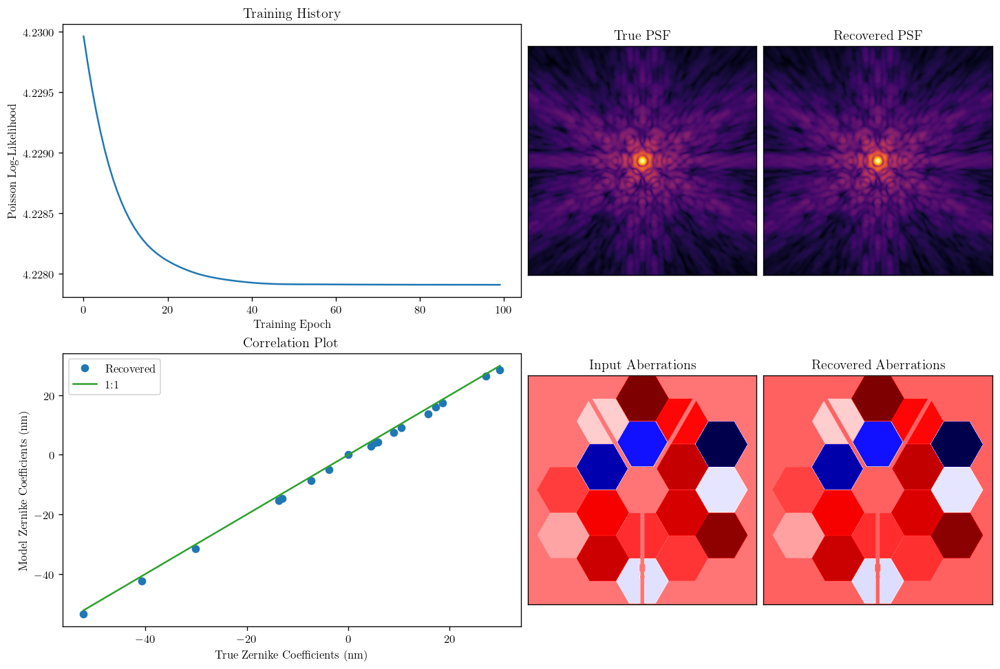

316.0
0.01575 arcsec / pix
Modeling mirror 8
opd_ref_focus: {} 6.714345736893632e-08
tilt_ref_offset: {} 5.412406381286715e-08
Modelling optics...
Modelling optics...ok


Gradient Descent:   0%|          | 0/100 [00:00<?, ?it/s]

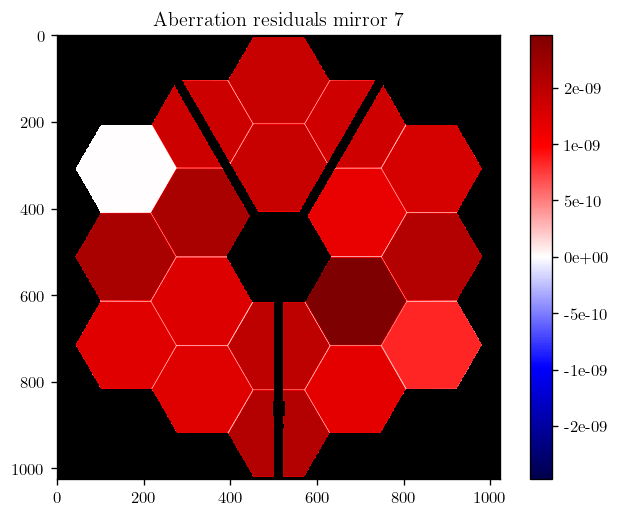

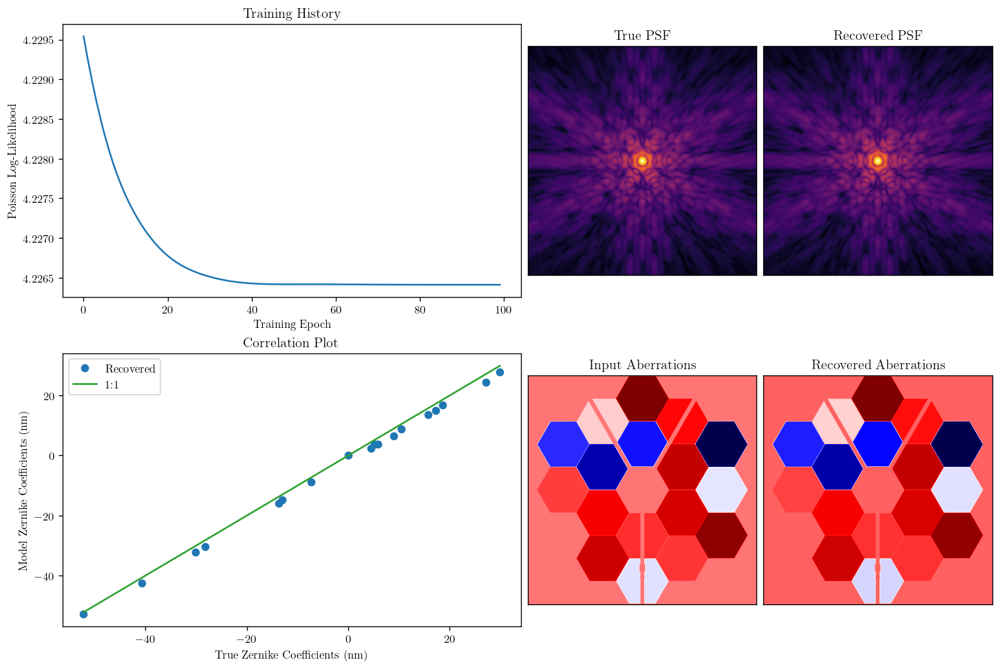

316.0
0.01575 arcsec / pix
Modeling mirror 9
opd_ref_focus: {} 6.714345736893632e-08
tilt_ref_offset: {} 5.412406381286715e-08
Modelling optics...
Modelling optics...ok


Gradient Descent:   0%|          | 0/100 [00:00<?, ?it/s]

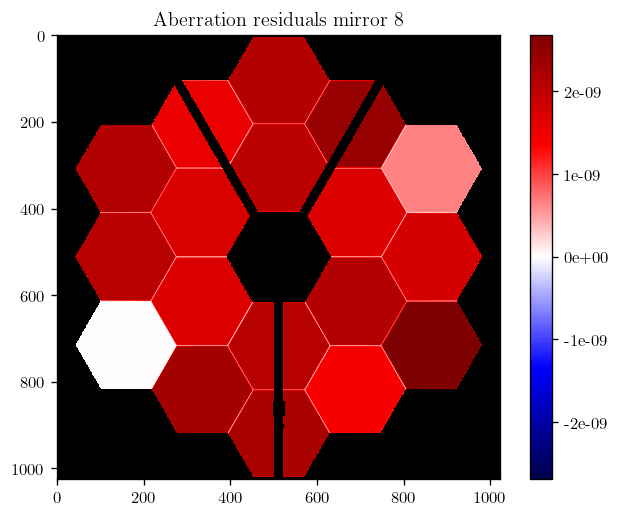

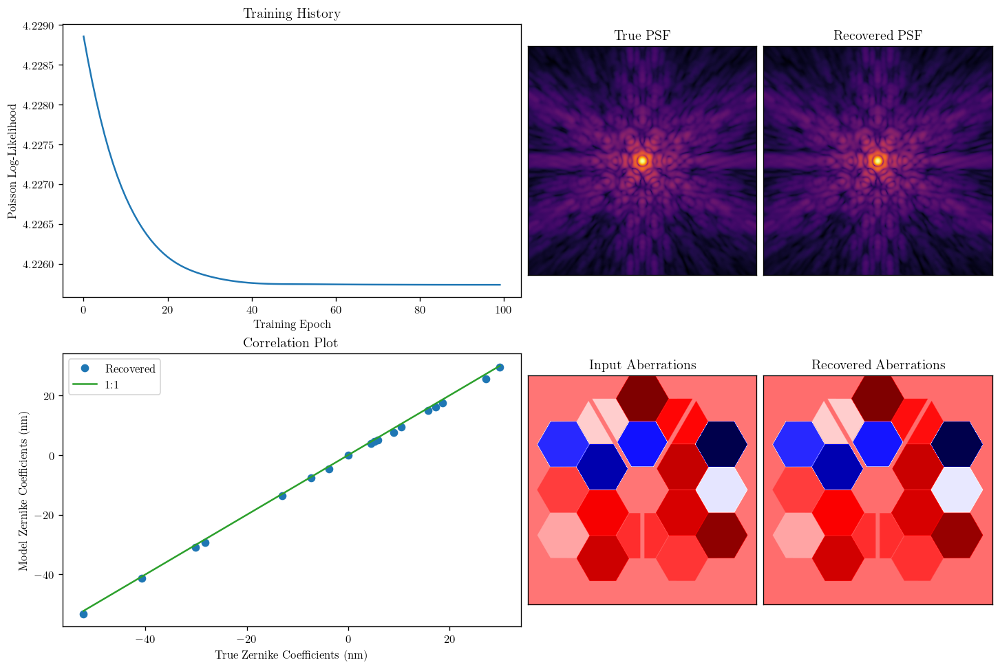

316.0
0.01575 arcsec / pix
Modeling mirror 10
opd_ref_focus: {} 6.714345736893632e-08
tilt_ref_offset: {} 5.412406381286715e-08
Modelling optics...
Modelling optics...ok


Gradient Descent:   0%|          | 0/100 [00:00<?, ?it/s]

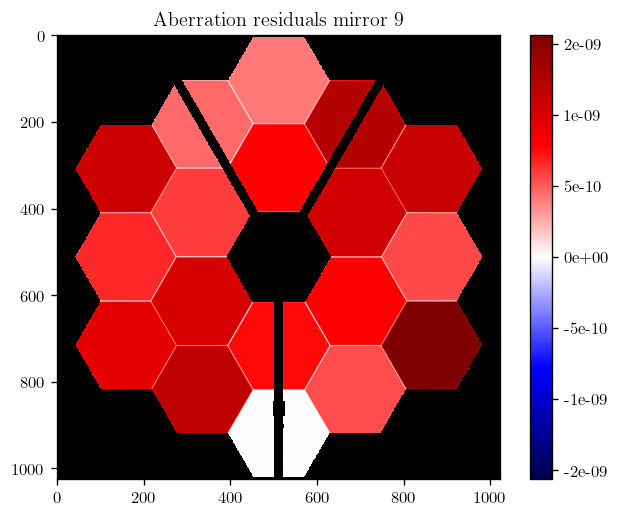

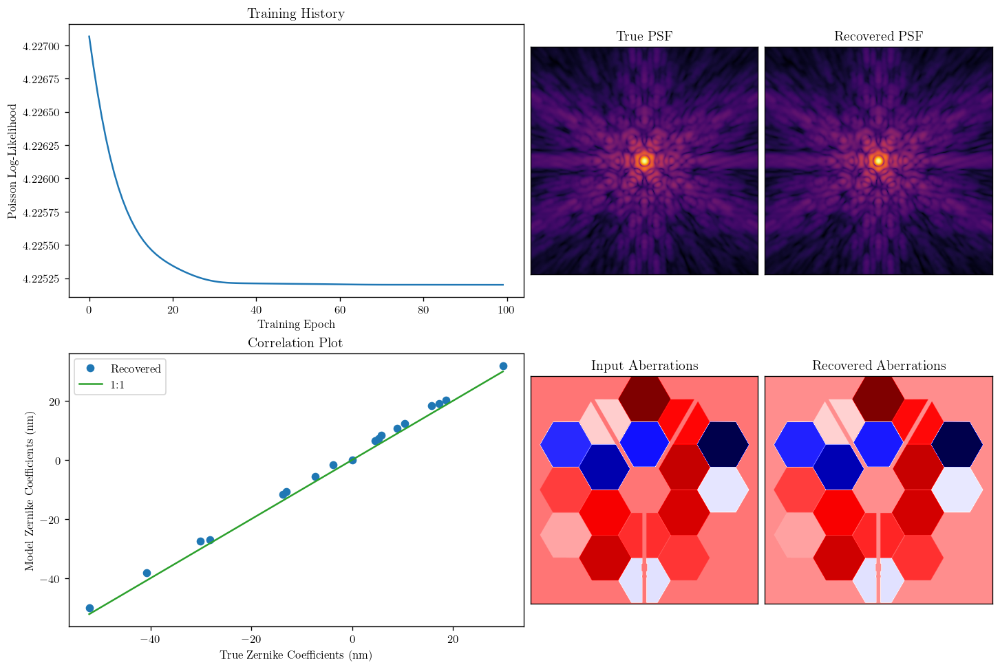

316.0
0.01575 arcsec / pix
Modeling mirror 11
opd_ref_focus: {} 6.714345736893632e-08
tilt_ref_offset: {} 5.412406381286715e-08
Modelling optics...
Modelling optics...ok


Gradient Descent:   0%|          | 0/100 [00:00<?, ?it/s]

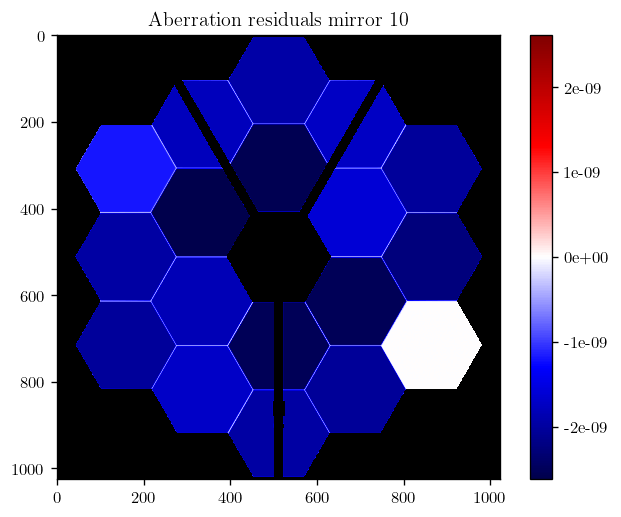

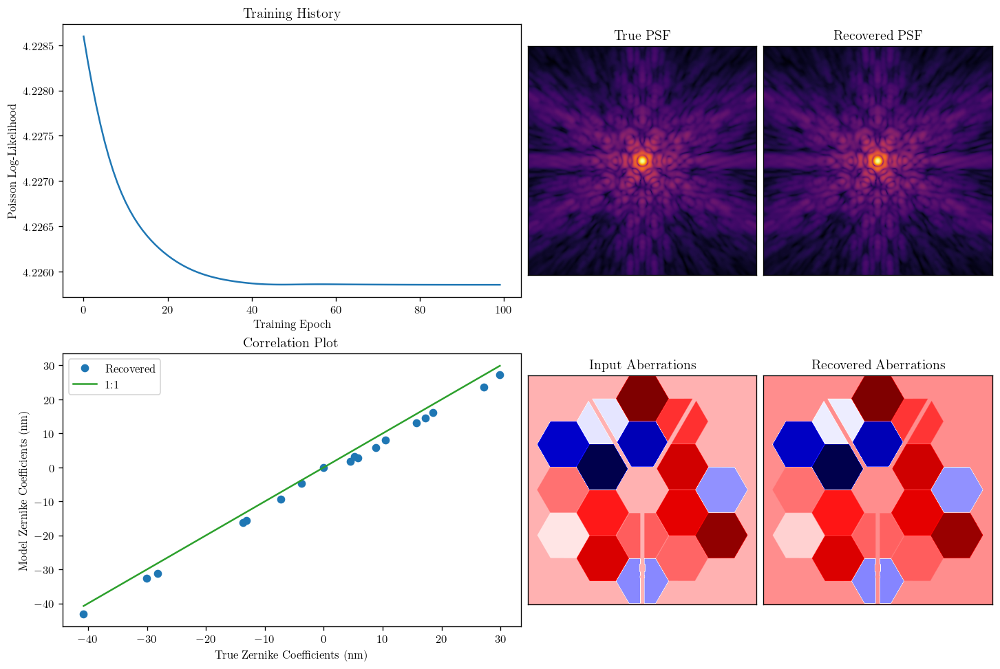

316.0
0.01575 arcsec / pix
Modeling mirror 12
opd_ref_focus: {} 6.714345736893632e-08
tilt_ref_offset: {} 5.412406381286715e-08
Modelling optics...
Modelling optics...ok


Gradient Descent:   0%|          | 0/100 [00:00<?, ?it/s]

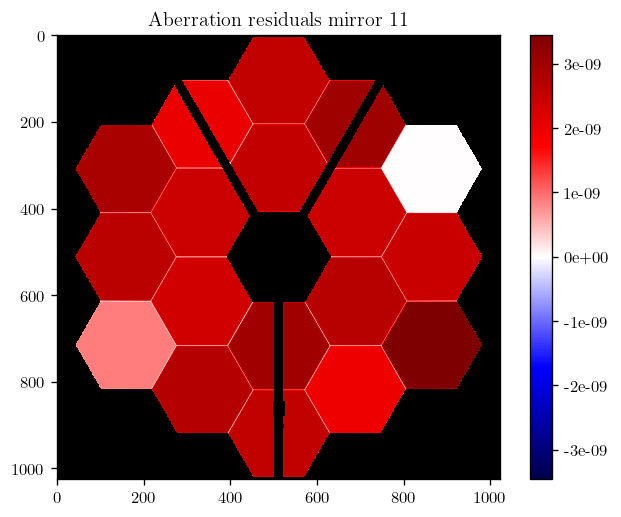

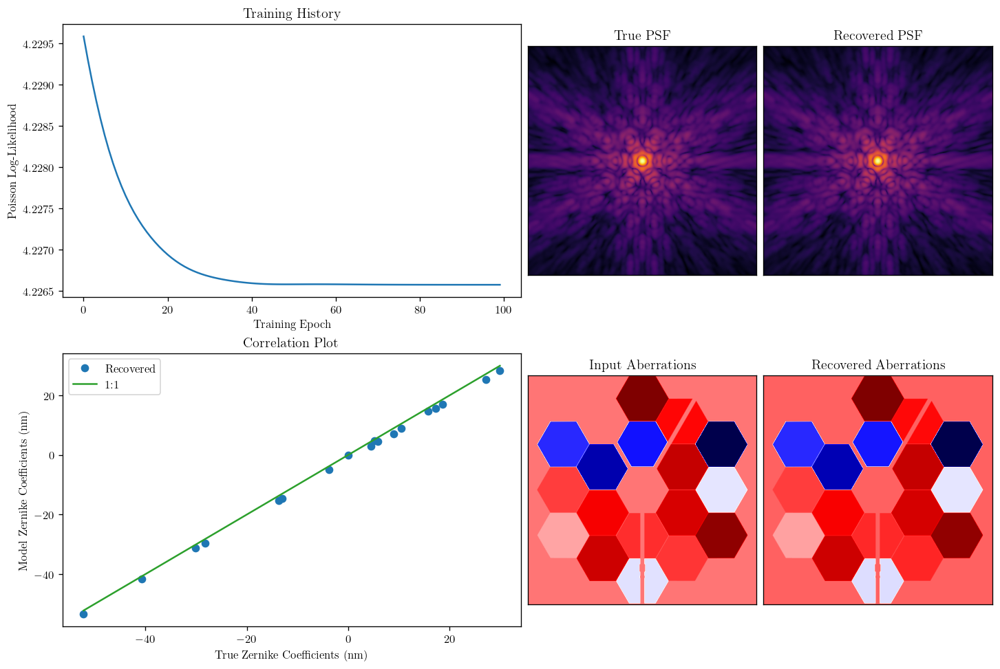

316.0
0.01575 arcsec / pix
Modeling mirror 13
opd_ref_focus: {} 6.714345736893632e-08
tilt_ref_offset: {} 5.412406381286715e-08
Modelling optics...
Modelling optics...ok


Gradient Descent:   0%|          | 0/100 [00:00<?, ?it/s]

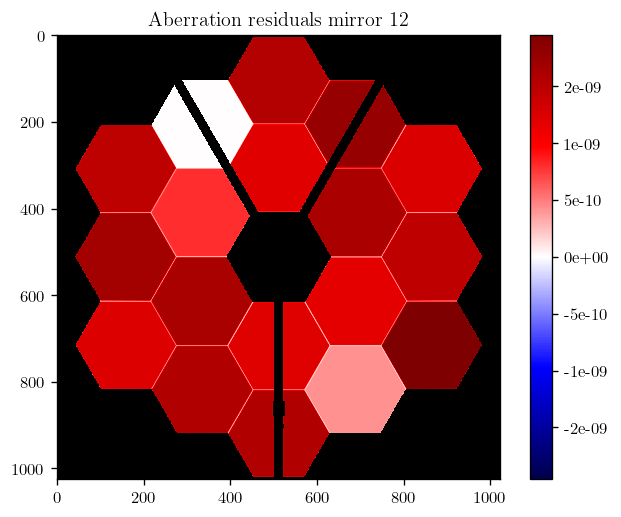

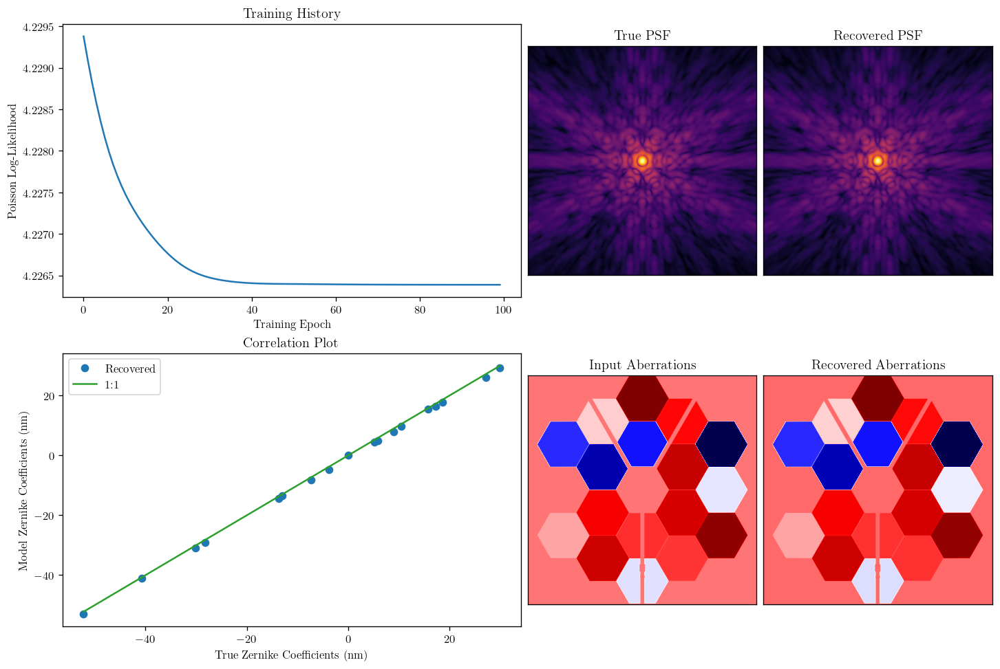

316.0
0.01575 arcsec / pix
Modeling mirror 14
opd_ref_focus: {} 6.714345736893632e-08
tilt_ref_offset: {} 5.412406381286715e-08
Modelling optics...
Modelling optics...ok


Gradient Descent:   0%|          | 0/100 [00:00<?, ?it/s]

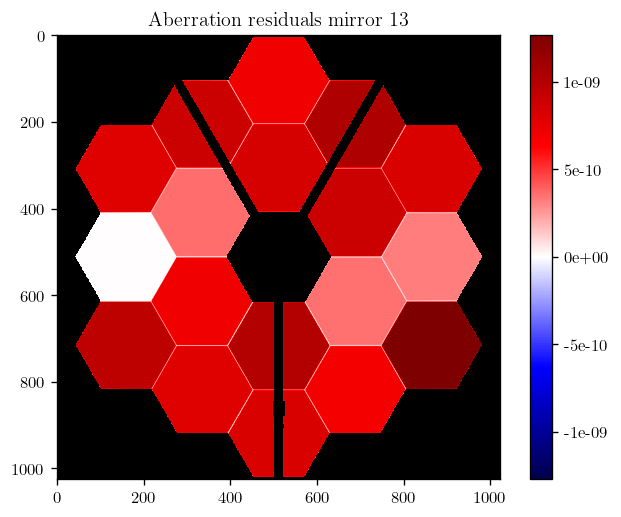

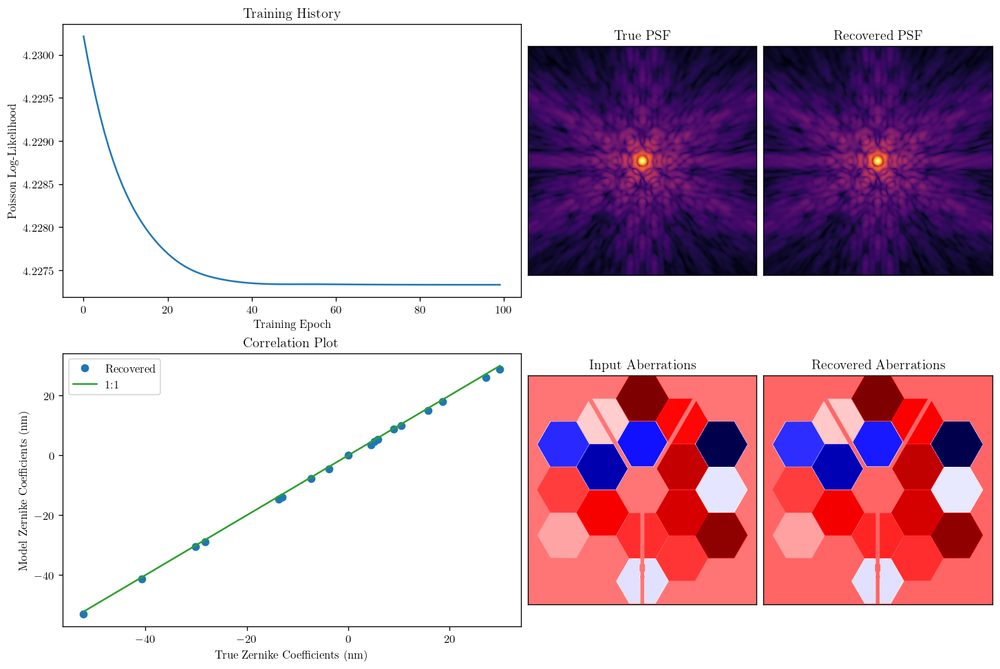

316.0
0.01575 arcsec / pix
Modeling mirror 15
opd_ref_focus: {} 6.714345736893632e-08
tilt_ref_offset: {} 5.412406381286715e-08
Modelling optics...
Modelling optics...ok


Gradient Descent:   0%|          | 0/100 [00:00<?, ?it/s]

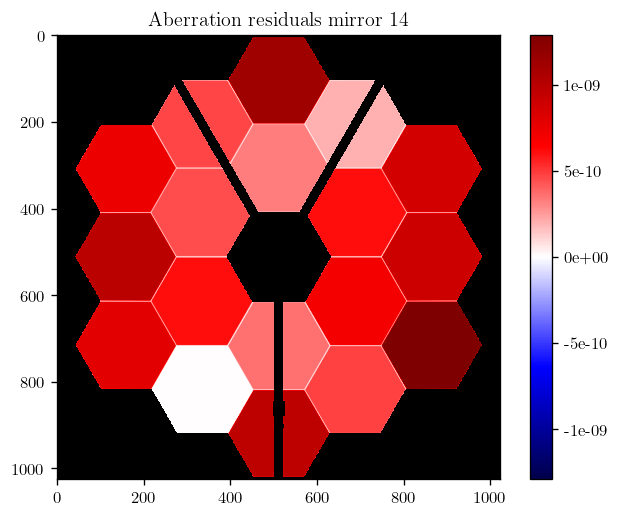

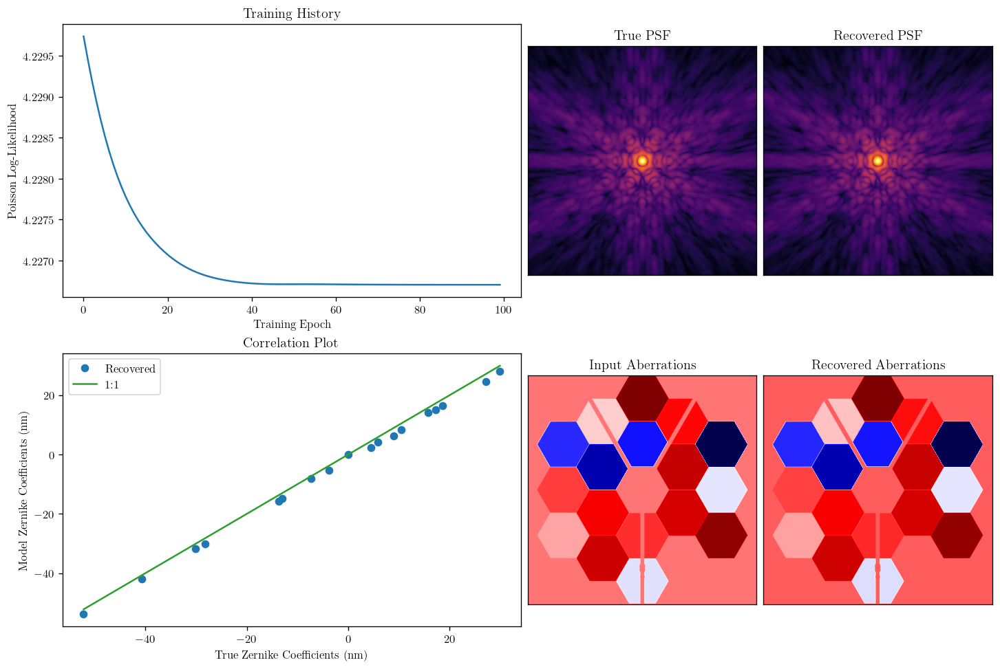

316.0
0.01575 arcsec / pix
Modeling mirror 16
opd_ref_focus: {} 6.714345736893632e-08
tilt_ref_offset: {} 5.412406381286715e-08
Modelling optics...
Modelling optics...ok


Gradient Descent:   0%|          | 0/100 [00:00<?, ?it/s]

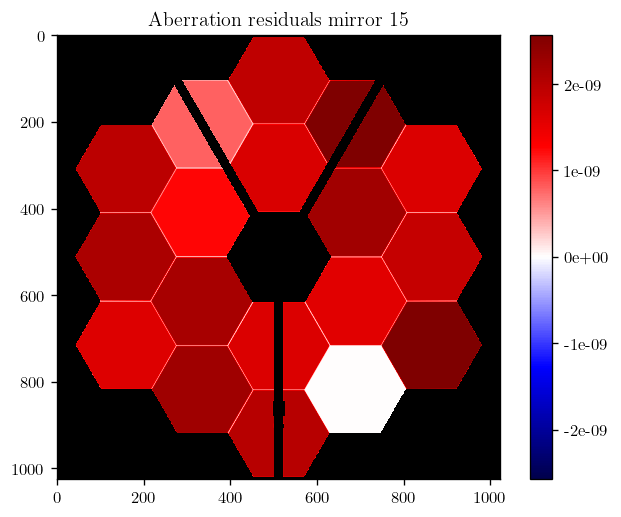

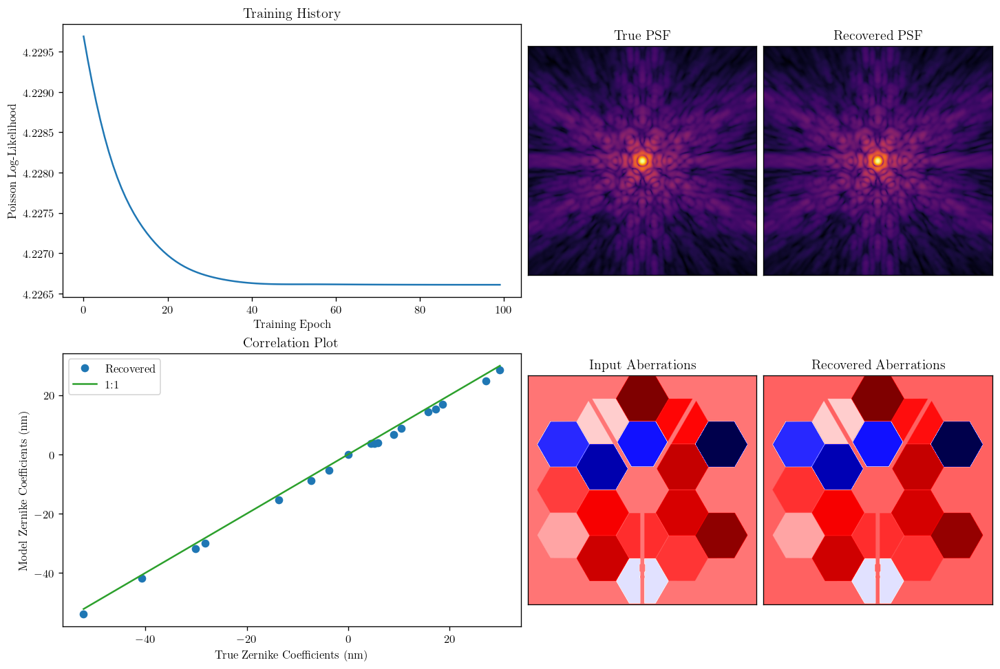

316.0
0.01575 arcsec / pix
Modeling mirror 17
opd_ref_focus: {} 6.714345736893632e-08
tilt_ref_offset: {} 5.412406381286715e-08
Modelling optics...
Modelling optics...ok


Gradient Descent:   0%|          | 0/100 [00:00<?, ?it/s]

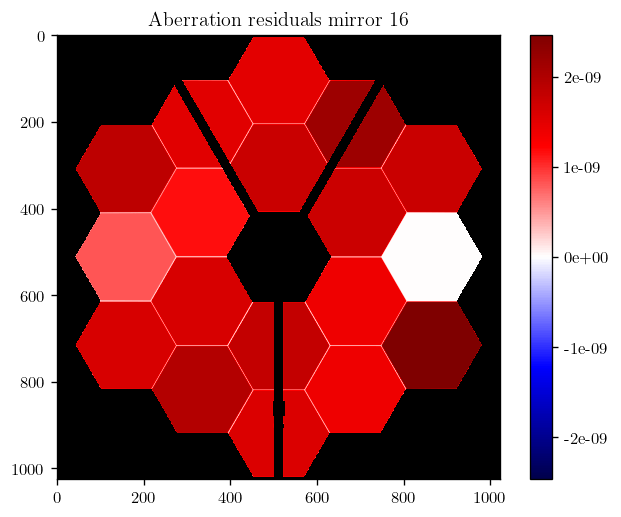

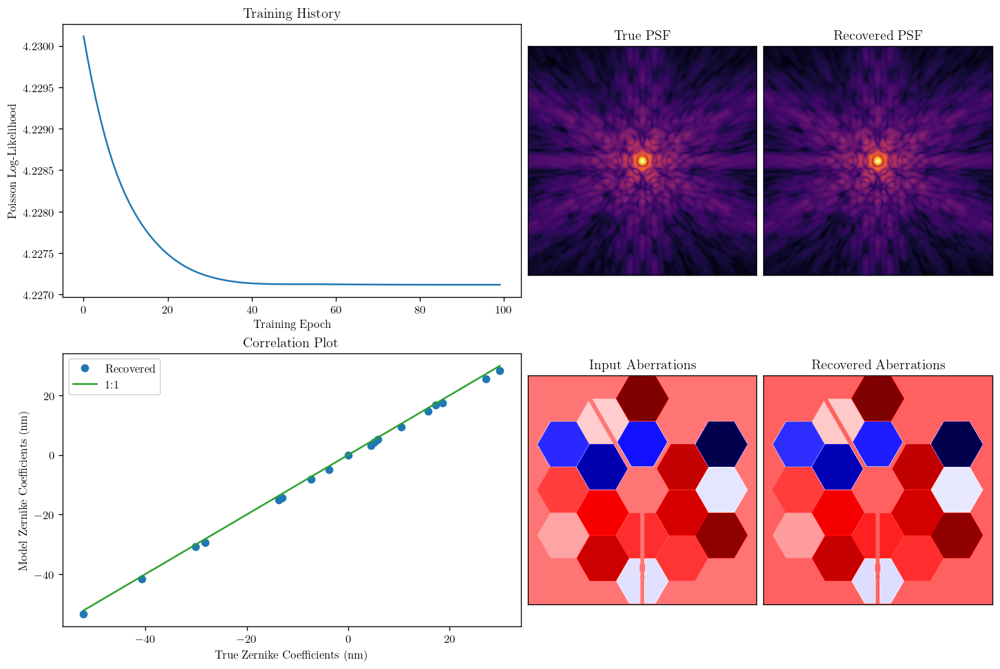

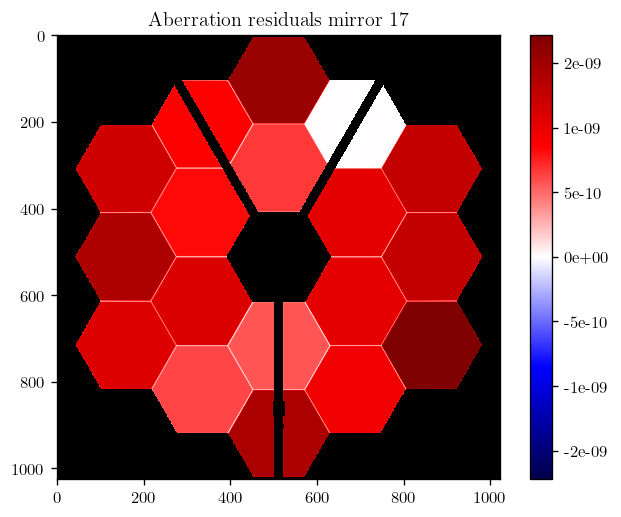

In [208]:
seed = 0xDEFDBE3F
initial_seed = 0xBED145

cmap1 = colormaps['seismic']
cmap1.set_bad('k',1.)
n_mir = 0

for n_mir in range(18):
    
    # Create a modeled coeffs array
    fix_n = n_mir
    coeffs = 2e-8*jr.normal(jr.PRNGKey(seed), (basis_flat.shape[0],))
    coeffs = coeffs.at[fix_n].set(0)
    base_aberrations = get_aber(coeffs, basis_flat)
    
    # Wavefront 
    npix = 1024
    diameter = pupil_plane.pixelscale.to('m/pix').value * pupil_plane.npix
    # diameter == 6.603464

    # Aperture and OPD
    webb_aper = nircam.planes[0].amplitude
    webb_opd = nircam.planes[0].opd
    pupil_mask = nircam.planes[3].amplitude

    # Detector
    det_npix = (det_plane.fov_pixels * det_plane.oversample).value
    print(det_npix)
    pscale = det_plane.pixelscale/det_plane.oversample
    print(pscale)
    pscale = pscale.to('radian/pix').value

    # pscale == 7.958548e-08

    # Make layers
    
    print(f"Modeling mirror {n_mir}")
    def get_optical_layers():
        optical_layers = [


            #Plane 0: Pupil plane: JWST Entrance Pupil
            dl.CreateWavefront(npix, diameter, 'Angular'),
            dl.TransmissiveOptic(webb_aper),
            dl.AddOPD(webb_opd),
            JWST_basis(basis_flat, coeffs, fix_n),

            #Plane 1: Coordinate Inversion in y axis
            InvertY(),

            #Plane 2: Pupil plane: NIRCamLWA internal WFE at V2V3=(1.46,-6.75)', near Z430R_A
            #dl.AddOPD(nircam.planes[4].get_opd(wavel)),
            dl.TransmissiveOptic(nircam.planes[2].amplitude),
            NIRCamFieldAndWavelengthDependentAberration(webb_osys, nircam.planes[2].opd, nircam.planes[2].zernike_coeffs),


            #Plane 3: Detector plane: NIRCam detector (79x79 pixels, 0.063 arcsec / pix)
            dl.AngularMFT(det_npix, pscale),         

        ]
        return optical_layers

    optical_layers = get_optical_layers()

    optics = dl.Optics(optical_layers)

    telescope = dl.Instrument(optics, source)

    @jit
    def model_optics_jit():
        return telescope.model()
    
    print("Modelling optics...")
    psf = model_optics_jit()
    print("Modelling optics...ok")
    psf_norm = psf/psf.sum()
    webbpsf_norm = webbpsf_data/webbpsf_data.sum()

    # Define path to the zernikes
    zernikes = 'JWST_basis.coeffs_model'

    # Generate new random set of zernikes
    coeffs_init_random = 2e-8*jr.normal(jr.PRNGKey(initial_seed), (basis_flat.shape[0],))
    coeffs_init = set_fixed(coeffs, coeffs_init_random, [n_mir])

    # Generate a new model with updated zernike coefficients

    model = telescope.set(zernikes, np.concatenate((coeffs_init[:fix_n], coeffs_init[fix_n+1:])))
    
    @zdx.filter_jit
    @zdx.filter_value_and_grad(zernikes)
    def loss_func(model, data):
        out = model.model()
        return -np.sum(jax.scipy.stats.poisson.logpmf(data, out))

    loss, initial_grads = loss_func(model, psf) # Compile
    
    optim, opt_state = zdx.get_optimiser(model, [zernikes], [optax.adam(2e-9)])

    losses, models_out = [], []
    with tqdm(range(100), desc='Gradient Descent') as t:
        for i in t: 
            # calculate the loss and gradient
            loss, grads = loss_func(model, psf)

            # apply the update
            updates, opt_state = optim.update(grads, opt_state)
            model = zdx.apply_updates(model, updates)

            # save results
            models_out.append(model) 
            losses.append(loss)

            t.set_description('Loss %.7f' % (loss)) # update the progress bar
    final_psf = model.model()

    model_basis = np.asarray((model.JWST_basis.basis).reshape((nzern*18, npix_basis, npix_basis)), dtype=float)
    model_coeffs = np.asarray((model.JWST_basis.coeffs).reshape(model.JWST_basis.coeffs.shape[0], 1, 1), dtype=float)
    model_result = model_coeffs* model_basis
    model_result.sum(0).shape
    
    coeffs_out = np.array([model_out.get(zernikes) for model_out in models_out])

    mosaic = """
        AABD
        GGEF
        """

    fig = plt.figure(constrained_layout=True,figsize=(12, 8))
    axes = fig.subplot_mosaic(mosaic)

    for ax in ['B','D','E','F']:
        axes[ax].set_xticks([])
        axes[ax].set_yticks([])

    axes['A'].plot(np.array(losses))
    axes['A'].set_title("Training History")
    axes['A'].set_xlabel('Training Epoch')
    axes['A'].set_ylabel('Poisson Log-Likelihood')

    axes['B'].imshow(psf**0.1)
    axes['B'].set_title('True PSF')

    axes['G'].plot(coeffs*1e9,model_coeffs.reshape(18,)*1e9,'.',markersize=12,color='C0',label='Recovered')
    #axes['G'].plot(coeffs*1e9,coeffs_init.reshape(18,)*1e9,'.',markersize=12,color='C1',label='Initial')

    axes['G'].plot(np.array([np.min(coeffs),np.max(coeffs)])*1e9,
                   np.array([np.min(coeffs),np.max(coeffs)])*1e9,
                   '-',color='C2',label='1:1')
    axes['G'].legend()
    axes['G'].set_title('Correlation Plot ')
    axes['G'].set_xlabel('True Zernike Coefficients (nm)')
    axes['G'].set_ylabel('Model Zernike Coefficients (nm)')

    axes['D'].imshow(final_psf**0.1)
    axes['D'].set_title('Recovered PSF')

    axes['E'].imshow(mask*base_aberrations, cmap=cmap)
    axes['E'].set_title('Input Aberrations')

    axes['F'].imshow(mask*model_result.sum(0), cmap=cmap)
    axes['F'].set_title('Recovered Aberrations')
    plt.show()
    
    filename0 = f"fixed_mirror_general_plot_{n_mir}.png"
    filepath0 = os.path.join("plots", filename0)  # Change "plots" to your desired folder name
    fig.savefig(filepath0)
    
    data = input_mask*(base_aberrations - model_result.sum(0))

    val_max = np.max(np.abs(base_aberrations - model_result.sum(0)))
    norm1 = colors.TwoSlopeNorm(vmin=-val_max, vmax=val_max, vcenter=0)
    
    fig_res, ax_res = plt.subplots()
    im = ax_res.imshow(mask*data, cmap=cmap1, norm=norm1)
    ax_res.set_title(f'Aberration residuals mirror {n_mir}')
    fig_res.colorbar(im,format='%.0e')
    
    # Save the plot to a file
    filename = f"fixed_mirror_{n_mir}.png"
    filepath = os.path.join("plots_residuals", filename)  # Change "plots" to your desired folder name
    fig_res.savefig(filepath)

    # Close the plot to release memory
    plt.close(fig)
    